In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [144]:
transform = transforms.Compose([transforms.Resize(300), transforms.ToTensor()])

In [110]:
from torchvision import datasets, transforms
import os
from PIL import Image

In [145]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self,path,transform):
        self.transform = transform
        self.filePath = path
        self.imageList = os.listdir(self.filePath)
        #self.imageList = natsort.natsorted(images)
        
    def __len__(self):
        return len(self.imageList)
        
    def __getitem__(self,idx):
        location = os.path.join(self.filePath, self.imageList[idx])
        image = Image.open(location).convert('RGB')
        transformedImage = self.transform(image)
        
        return transformedImage

In [146]:
trainData = CustomDataset('data/trainData',transform)
trainLoader = torch.utils.data.DataLoader(trainData,batch_size=1,shuffle=True)

In [134]:
class Net(nn.Module):
    
    def __init__(self):
        super(Net,self).__init__()
        
        self.pool = nn.MaxPool2d(2,2)
        
        self.conv1 = nn.Conv2d(3,6,5,stride=(2,2))
        self.conv2 = nn.Conv2d(6,10,5,stride=(2,2))
        
        self.bn1 = nn.BatchNorm2d(num_features=6)
        self.bn2 = nn.BatchNorm2d(num_features=10)
        self.bn3 = nn.InstanceNorm1d(100)
        
        self.fc1 = nn.Linear(2890,200)
        self.fc2 = nn.Linear(200,100)
        self.fc3 = nn.Linear(500,100)
        self.fc4 = nn.Linear(100,10)
        self.fc5 = nn.Linear(10,1)
        
    def forward(self,x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.bn1(x)
        x = self.pool(F.relu(self.conv2(x)))
        x = self.bn2(x)
        
        x = torch.flatten(x,1)
        
        x = F.tanh(self.fc1(x))
        x = F.tanh(self.fc2(x))
        x = self.bn3(x)
        x = F.tanh(self.fc4(x))
        x = F.sigmoid(self.fc5(x))
        
        return x
        
        

In [33]:
def imshow(img):
    img = img/2 + 0.5
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg,(1,2,0)))
    plt.axis('off')
    plt.show()

In [147]:
sampler = iter(trainLoader)

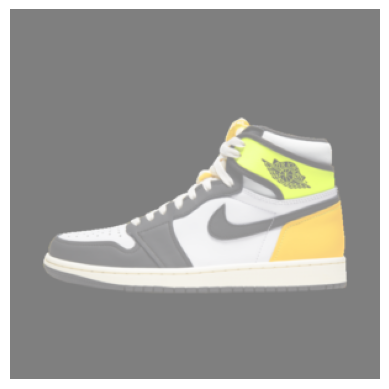

In [148]:
images = next(sampler)
imshow(torchvision.utils.make_grid(images))

In [60]:
images.dtype

torch.float32

In [57]:
answerTable = {'y': 1, 'n': 0}

In [153]:
net = Net()
criterion = nn.BCELoss()
optimiser = optim.Adam(net.parameters(), lr=1e-5)

In [154]:
def getLabel():
    while True:
        label = str(input('Do you like this shoe (y/n)?: '))
        if label and label.lower()[0] in answerTable:
            label = answerTable[label.lower()[0]]
            break
        elif label and label.lower()[0] == 'q': break
    if isinstance(label,str) and label.lower()[0] == 'q': return 'q'
    return torch.tensor([[label]], dtype = torch.float32)

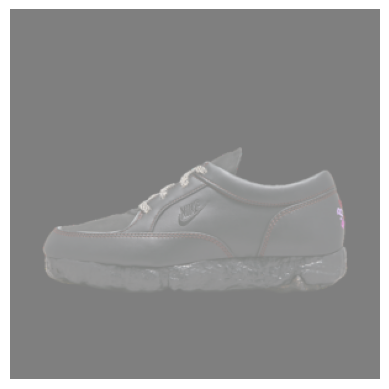

Do you like this shoe (y/n)?: n
tensor([[0.5488]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7959060072898865 tensor([[0.5488]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


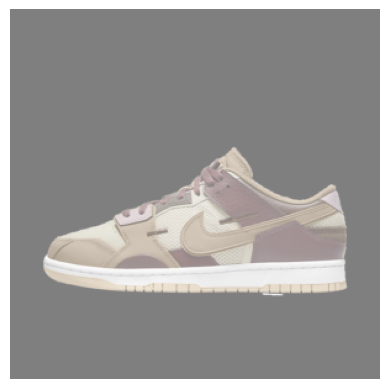

Do you like this shoe (y/n)?: 
Do you like this shoe (y/n)?: n
tensor([[0.5825]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8734567165374756 tensor([[0.5825]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


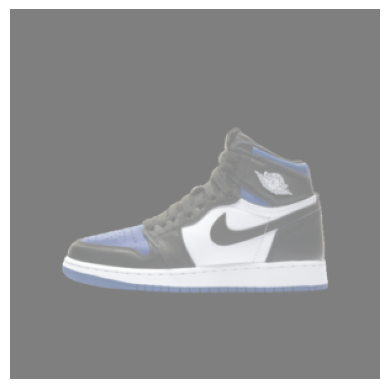

Do you like this shoe (y/n)?: y
tensor([[0.4820]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7297622561454773 tensor([[0.4820]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


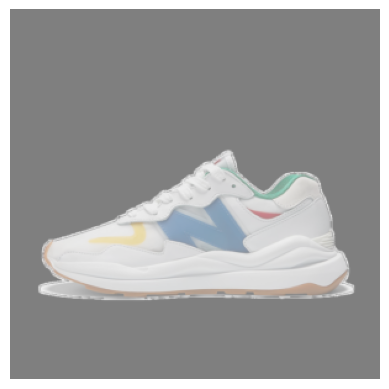

Do you like this shoe (y/n)?: y
tensor([[0.5289]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6370126605033875 tensor([[0.5289]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


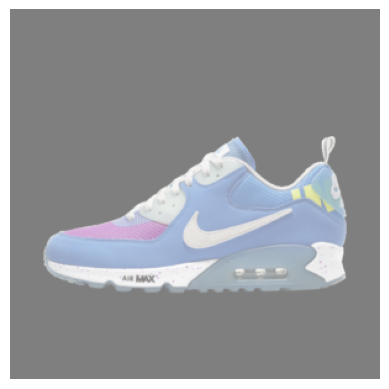

Do you like this shoe (y/n)?: y
tensor([[0.5610]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.578019917011261 tensor([[0.5610]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


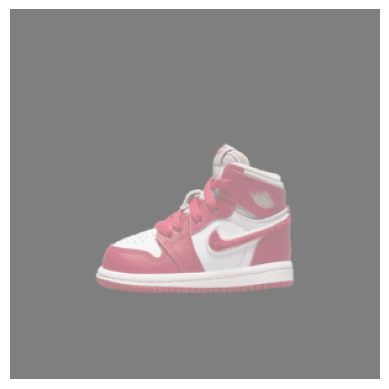

Do you like this shoe (y/n)?: n
tensor([[0.5269]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7484173774719238 tensor([[0.5269]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


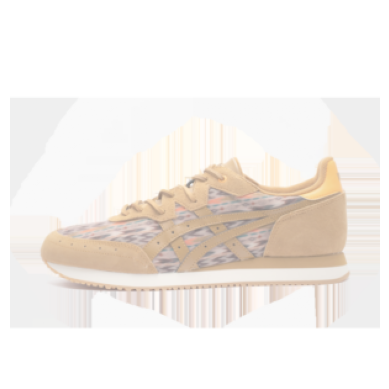

Do you like this shoe (y/n)?: n
tensor([[0.4705]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6358274221420288 tensor([[0.4705]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


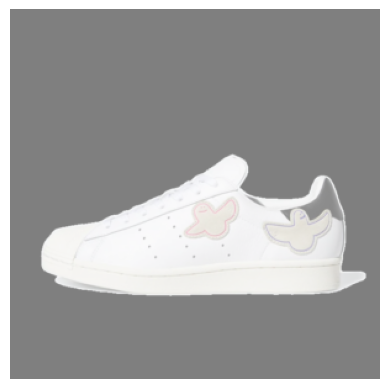

Do you like this shoe (y/n)?: y
tensor([[0.4974]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.698282778263092 tensor([[0.4974]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


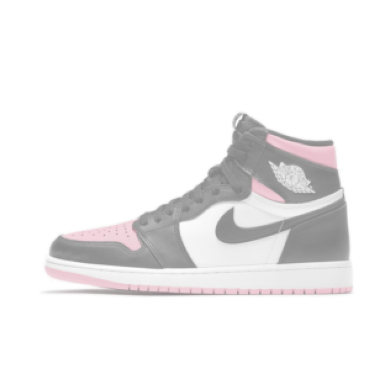

Do you like this shoe (y/n)?: y
tensor([[0.4669]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7616115808486938 tensor([[0.4669]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


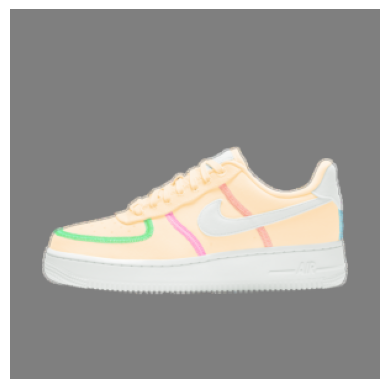

Do you like this shoe (y/n)?: y
tensor([[0.5940]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5209301710128784 tensor([[0.5940]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


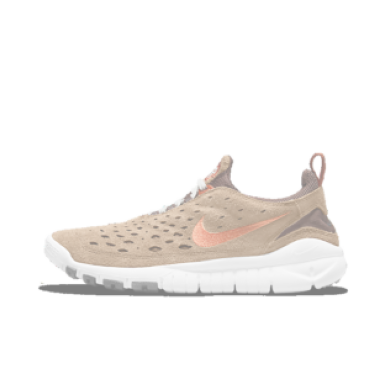

Do you like this shoe (y/n)?: y
tensor([[0.4300]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8440714478492737 tensor([[0.4300]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


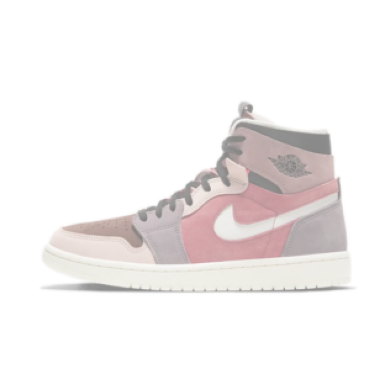

Do you like this shoe (y/n)?: yy
tensor([[0.5688]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5641888380050659 tensor([[0.5688]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


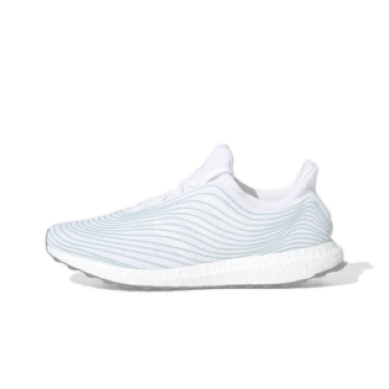

Do you like this shoe (y/n)?: y
tensor([[0.4923]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7086496353149414 tensor([[0.4923]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


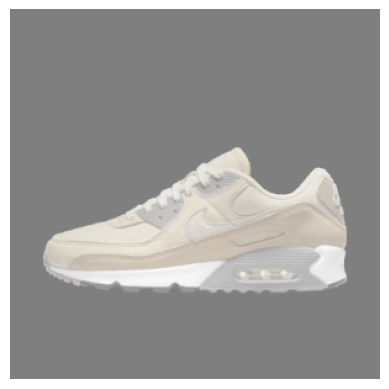

Do you like this shoe (y/n)?: y
tensor([[0.6063]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5003727078437805 tensor([[0.6063]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


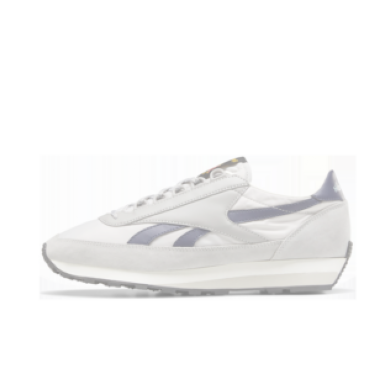

Do you like this shoe (y/n)?: n
tensor([[0.5521]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8032103180885315 tensor([[0.5521]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


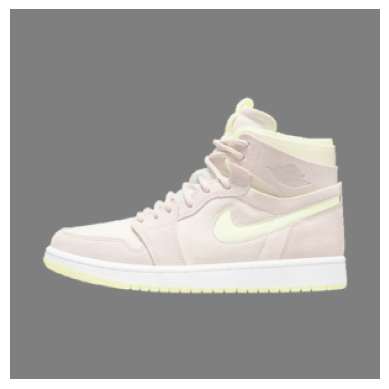

Do you like this shoe (y/n)?: n
tensor([[0.5773]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8611361980438232 tensor([[0.5773]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


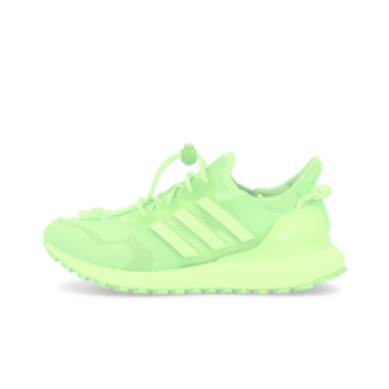

Do you like this shoe (y/n)?: y
tensor([[0.5412]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6138849258422852 tensor([[0.5412]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


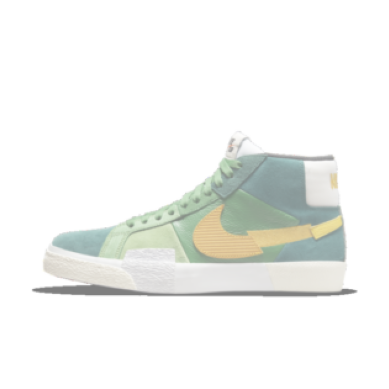

Do you like this shoe (y/n)?: y
tensor([[0.4997]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6936615705490112 tensor([[0.4997]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


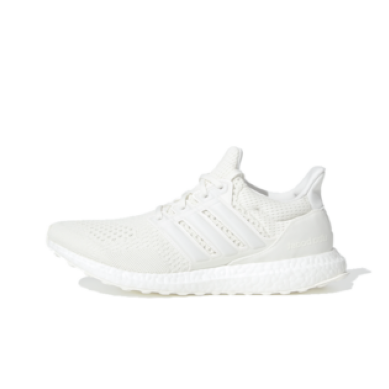

Do you like this shoe (y/n)?: y
tensor([[0.5739]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5553156137466431 tensor([[0.5739]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


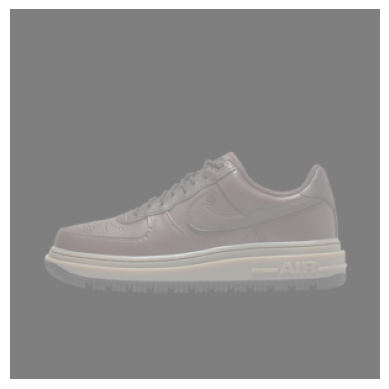

Do you like this shoe (y/n)?: y
tensor([[0.6306]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.46102818846702576 tensor([[0.6306]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


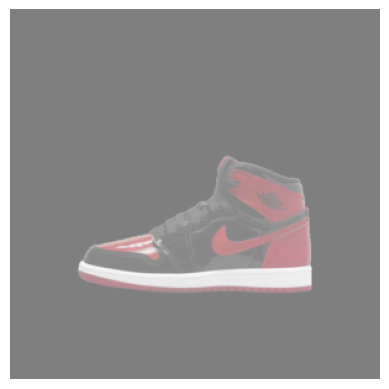

Do you like this shoe (y/n)?: y
tensor([[0.5143]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6649436950683594 tensor([[0.5143]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


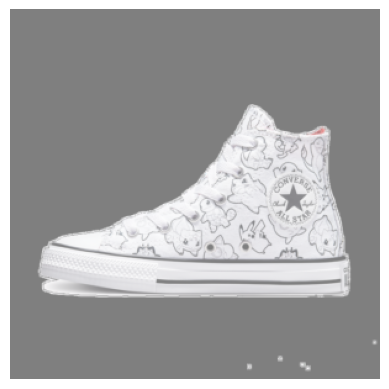

Do you like this shoe (y/n)?: n
tensor([[0.6306]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9957652688026428 tensor([[0.6306]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


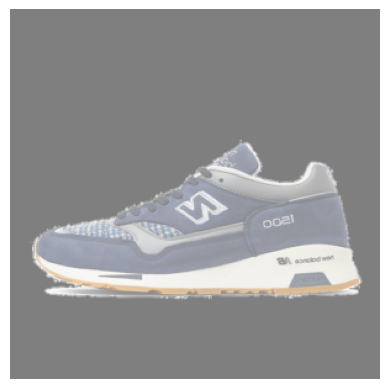

Do you like this shoe (y/n)?: y
tensor([[0.5652]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5705527067184448 tensor([[0.5652]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


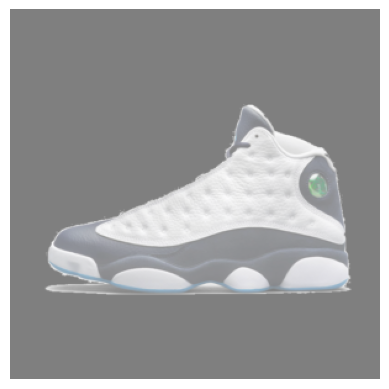

Do you like this shoe (y/n)?: y
tensor([[0.5480]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6015004515647888 tensor([[0.5480]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


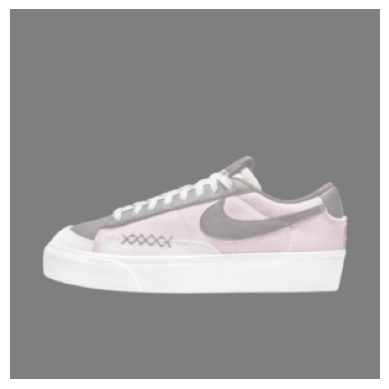

Do you like this shoe (y/n)?: n
tensor([[0.6331]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0026530027389526 tensor([[0.6331]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


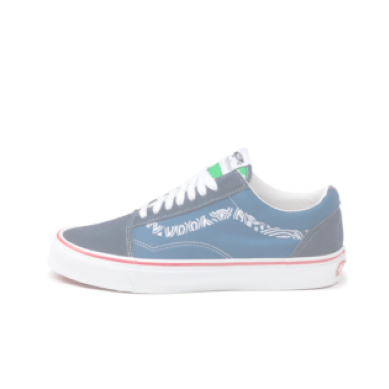

Do you like this shoe (y/n)?: n
tensor([[0.4656]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6265891194343567 tensor([[0.4656]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


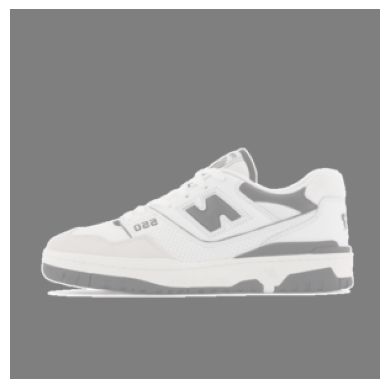

Do you like this shoe (y/n)?: y
tensor([[0.5617]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5767025351524353 tensor([[0.5617]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


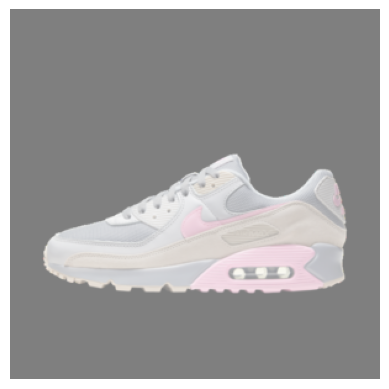

Do you like this shoe (y/n)?: y
tensor([[0.6800]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.38565537333488464 tensor([[0.6800]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


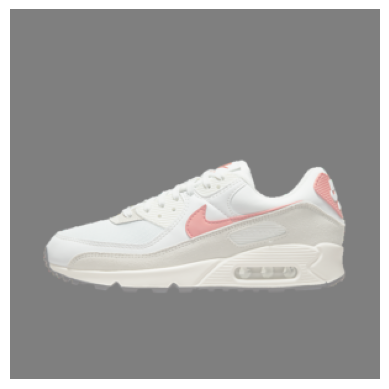

Do you like this shoe (y/n)?: y
tensor([[0.6282]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.46484726667404175 tensor([[0.6282]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


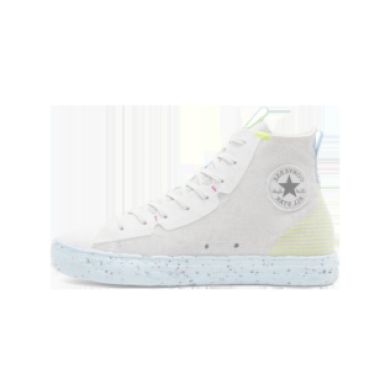

Do you like this shoe (y/n)?: n
tensor([[0.6718]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.1141060590744019 tensor([[0.6718]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


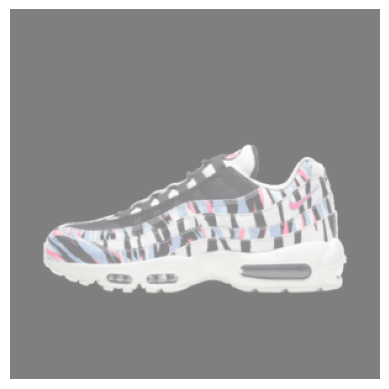

Do you like this shoe (y/n)?: y
tensor([[0.6420]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.44322580099105835 tensor([[0.6420]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


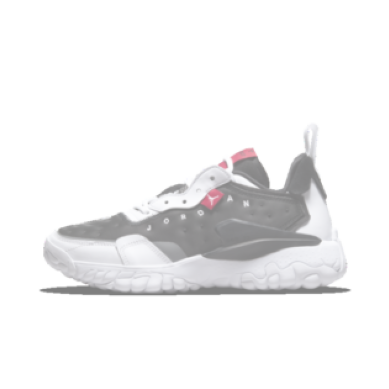

Do you like this shoe (y/n)?: y
tensor([[0.6194]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.47901445627212524 tensor([[0.6194]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


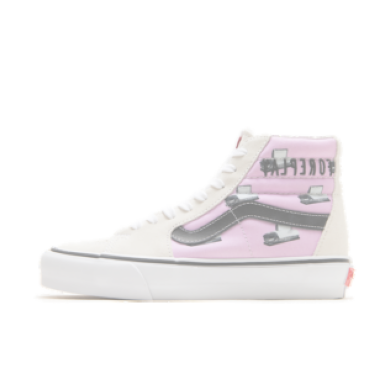

Do you like this shoe (y/n)?: n
tensor([[0.5106]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7146073579788208 tensor([[0.5106]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


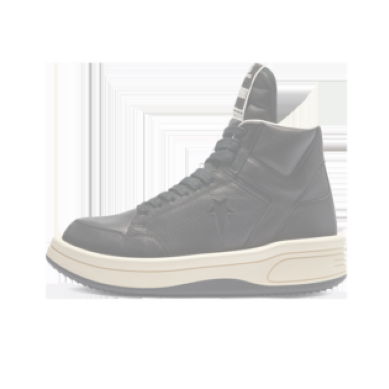

Do you like this shoe (y/n)?: n
tensor([[0.6238]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9776952862739563 tensor([[0.6238]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


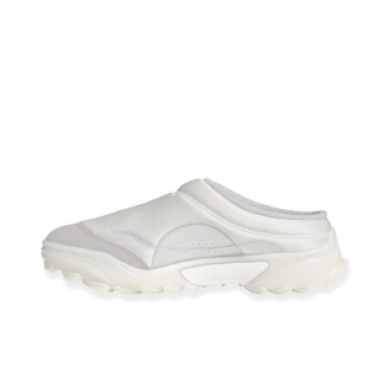

Do you like this shoe (y/n)?: n
tensor([[0.4306]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5631441473960876 tensor([[0.4306]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


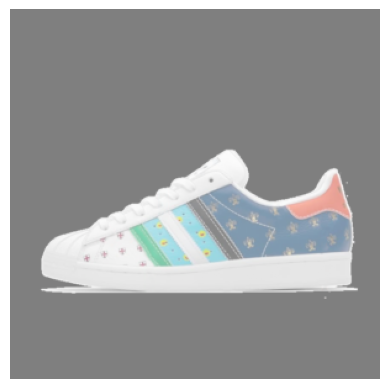

Do you like this shoe (y/n)?: n
tensor([[0.6449]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0354114770889282 tensor([[0.6449]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


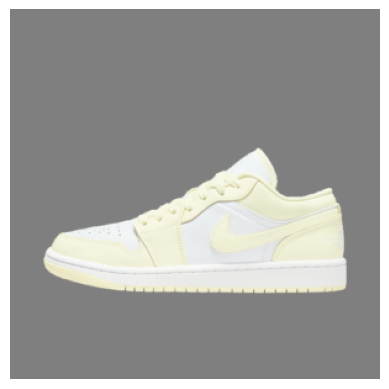

Do you like this shoe (y/n)?: n
tensor([[0.6397]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0208481550216675 tensor([[0.6397]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


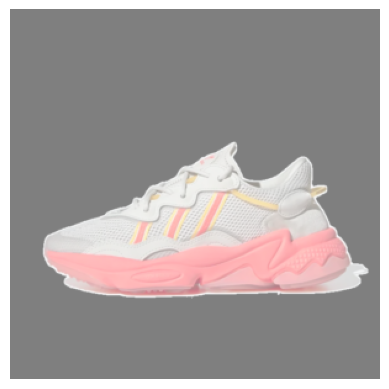

Do you like this shoe (y/n)?: y
tensor([[0.6731]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.3958967924118042 tensor([[0.6731]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


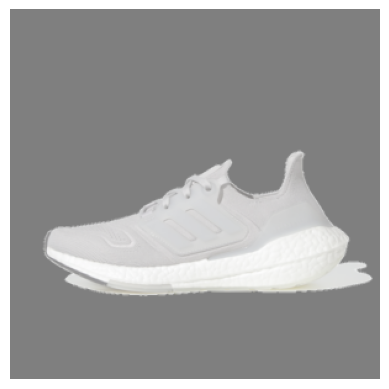

Do you like this shoe (y/n)?: n
tensor([[0.6691]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.1058069467544556 tensor([[0.6691]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


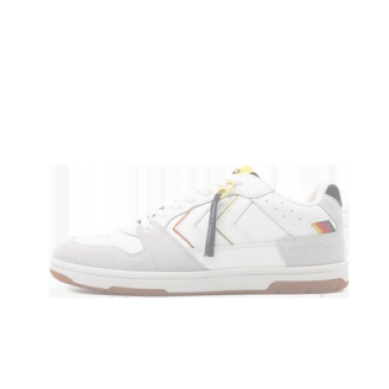

Do you like this shoe (y/n)?: n
tensor([[0.6420]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0271868705749512 tensor([[0.6420]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


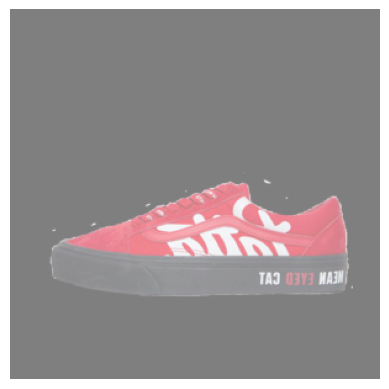

Do you like this shoe (y/n)?: n
tensor([[0.5499]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7982109189033508 tensor([[0.5499]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


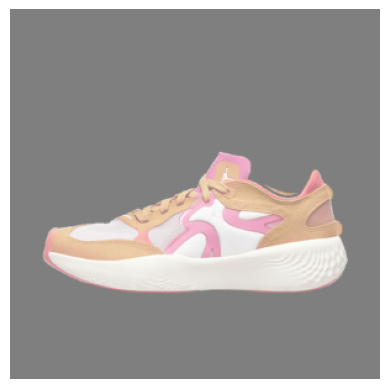

Do you like this shoe (y/n)?: n
tensor([[0.6247]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9800270795822144 tensor([[0.6247]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


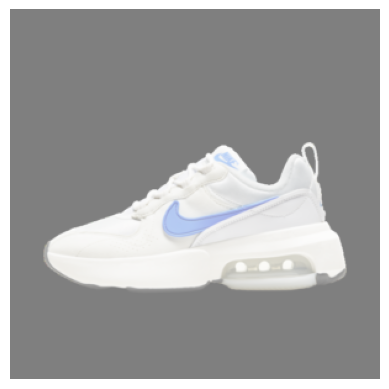

Do you like this shoe (y/n)?: y
tensor([[0.6154]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4854593575000763 tensor([[0.6154]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


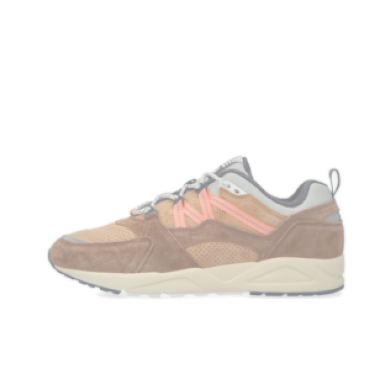

Do you like this shoe (y/n)?: n
tensor([[0.5156]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7249384522438049 tensor([[0.5156]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


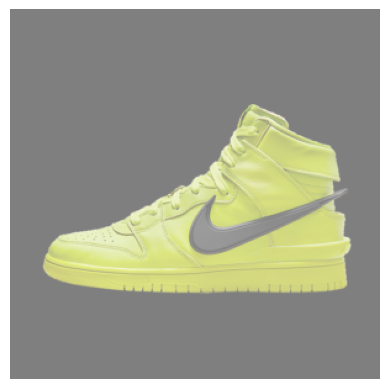

Do you like this shoe (y/n)?: y
tensor([[0.6128]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4896491467952728 tensor([[0.6128]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


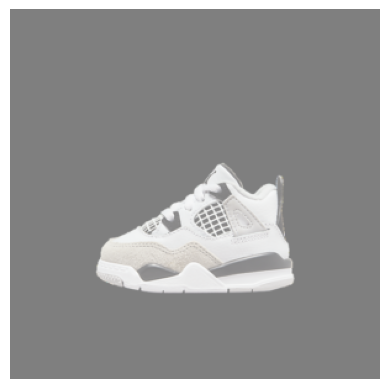

Do you like this shoe (y/n)?: n
tensor([[0.5304]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7558329701423645 tensor([[0.5304]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


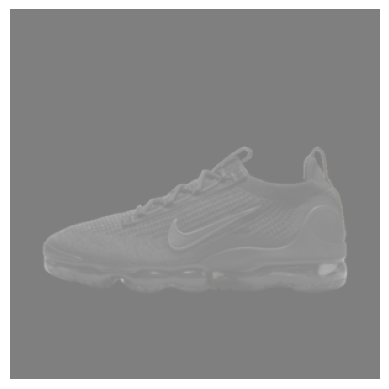

Do you like this shoe (y/n)?: y
tensor([[0.6359]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4527857303619385 tensor([[0.6359]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


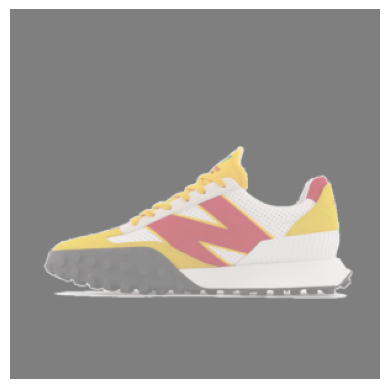

Do you like this shoe (y/n)?: yy
tensor([[0.5557]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5876145362854004 tensor([[0.5557]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


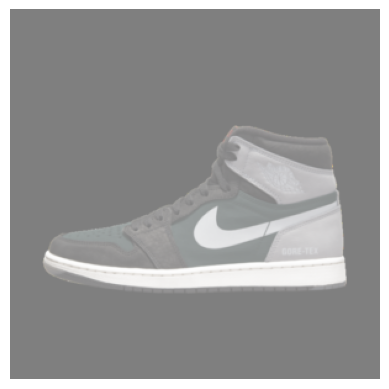

Do you like this shoe (y/n)?: n
tensor([[0.6425]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0285416841506958 tensor([[0.6425]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


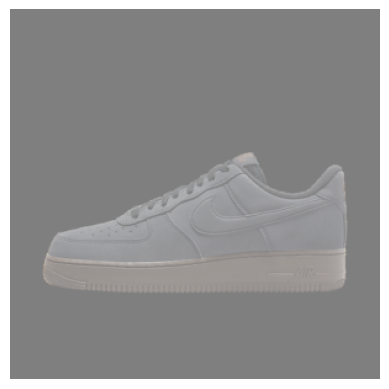

Do you like this shoe (y/n)?: y
tensor([[0.6102]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4940308630466461 tensor([[0.6102]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


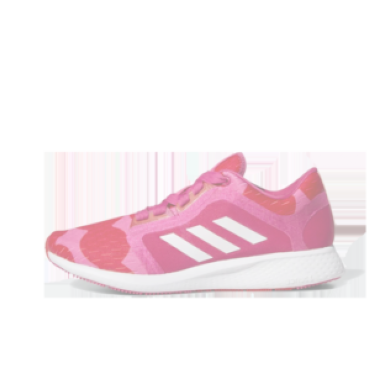

Do you like this shoe (y/n)?: n
tensor([[0.4020]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5141035914421082 tensor([[0.4020]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


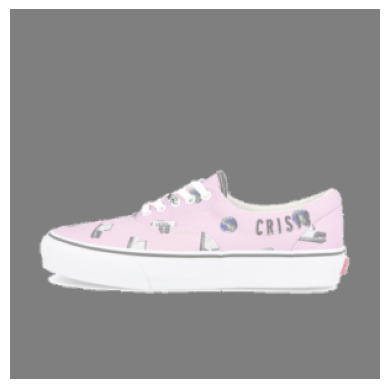

Do you like this shoe (y/n)?: n
tensor([[0.6341]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0052716732025146 tensor([[0.6341]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


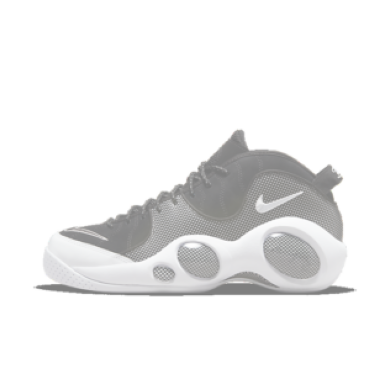

Do you like this shoe (y/n)?: y
tensor([[0.5779]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5483389496803284 tensor([[0.5779]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


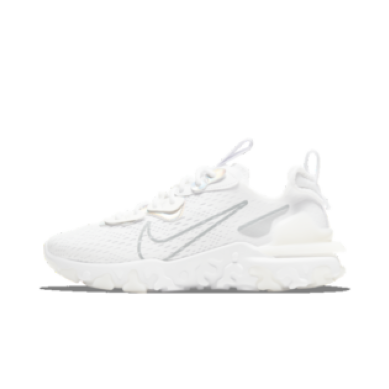

Do you like this shoe (y/n)?: y
tensor([[0.5234]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6473978757858276 tensor([[0.5234]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


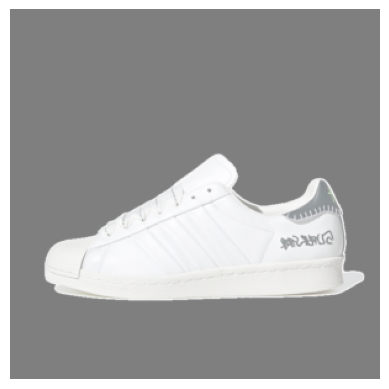

Do you like this shoe (y/n)?: n
tensor([[0.5786]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8641840815544128 tensor([[0.5786]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


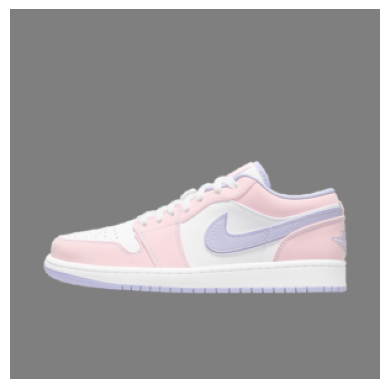

Do you like this shoe (y/n)?: n
tensor([[0.6094]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9401260018348694 tensor([[0.6094]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


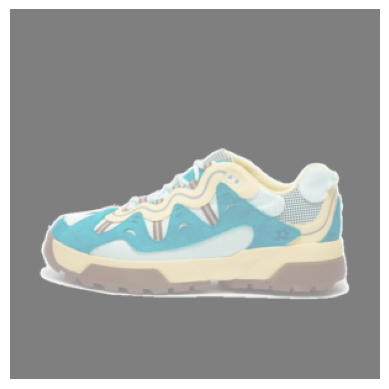

Do you like this shoe (y/n)?: n
tensor([[0.6800]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.1395624876022339 tensor([[0.6800]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


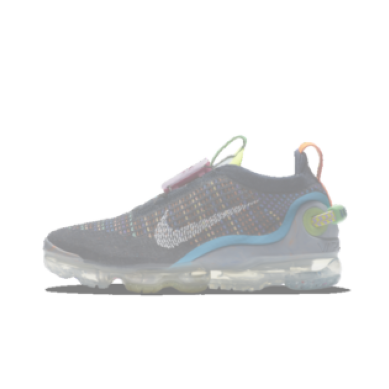

Do you like this shoe (y/n)?: y
tensor([[0.5082]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6768378615379333 tensor([[0.5082]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


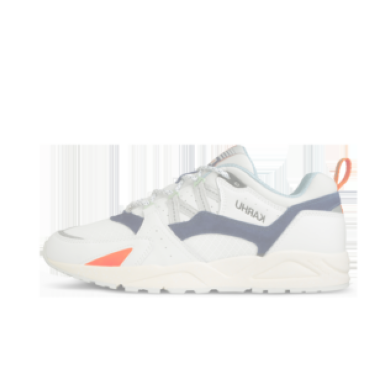

Do you like this shoe (y/n)?: n
tensor([[0.5140]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7215814590454102 tensor([[0.5140]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


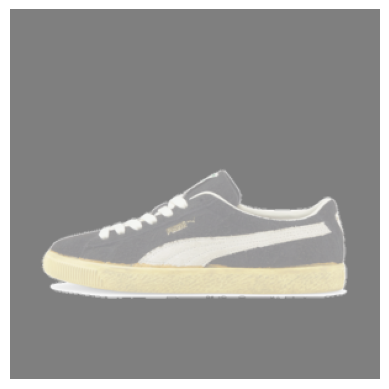

Do you like this shoe (y/n)?: y
tensor([[0.6143]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.48725923895835876 tensor([[0.6143]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


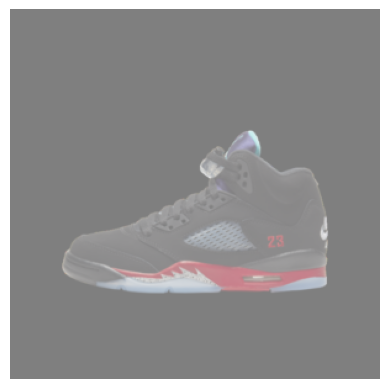

Do you like this shoe (y/n)?: y
tensor([[0.6333]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.45675304532051086 tensor([[0.6333]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


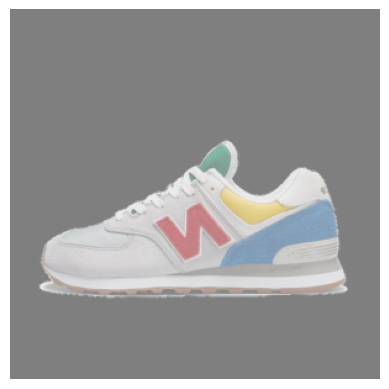

Do you like this shoe (y/n)?: y
tensor([[0.5764]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5508795380592346 tensor([[0.5764]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


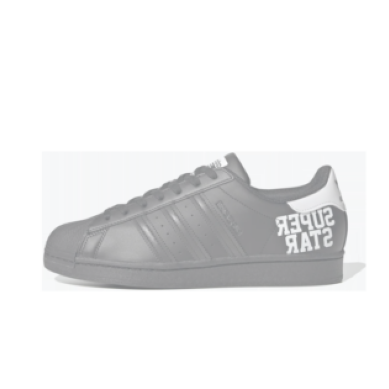

Do you like this shoe (y/n)?: n
tensor([[0.4458]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5901799201965332 tensor([[0.4458]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


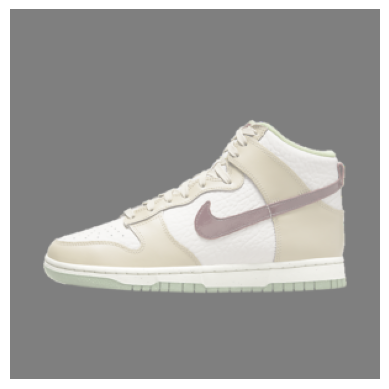

Do you like this shoe (y/n)?: y
tensor([[0.5556]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.587623119354248 tensor([[0.5556]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


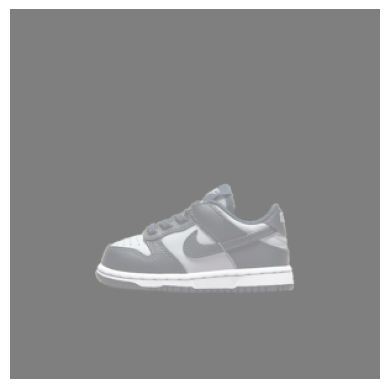

Do you like this shoe (y/n)?: y
tensor([[0.4475]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8041006922721863 tensor([[0.4475]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


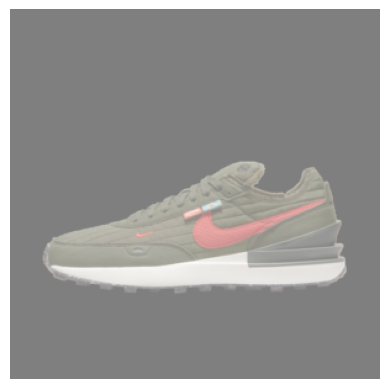

Do you like this shoe (y/n)?: y
tensor([[0.5429]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6107578277587891 tensor([[0.5429]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


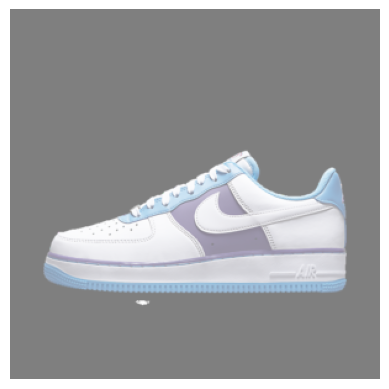

Do you like this shoe (y/n)?: y
tensor([[0.6052]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5022221207618713 tensor([[0.6052]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


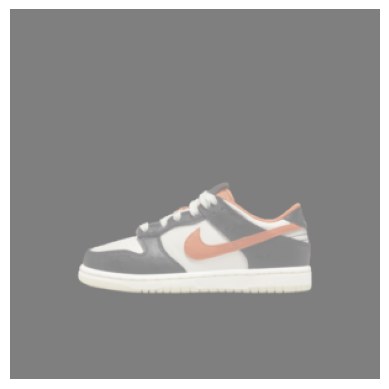

Do you like this shoe (y/n)?: y
tensor([[0.4959]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7012820243835449 tensor([[0.4959]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


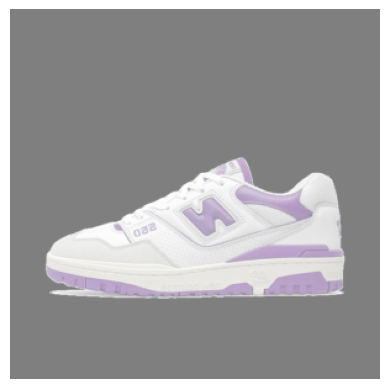

Do you like this shoe (y/n)?: y
tensor([[0.5664]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5683854222297668 tensor([[0.5664]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


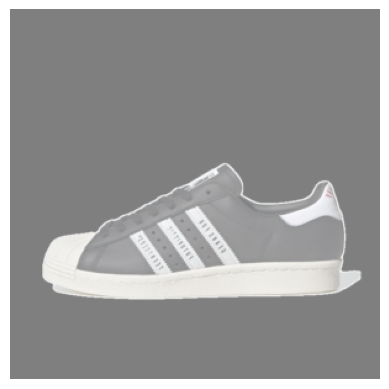

Do you like this shoe (y/n)?: n
tensor([[0.4926]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6784025430679321 tensor([[0.4926]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


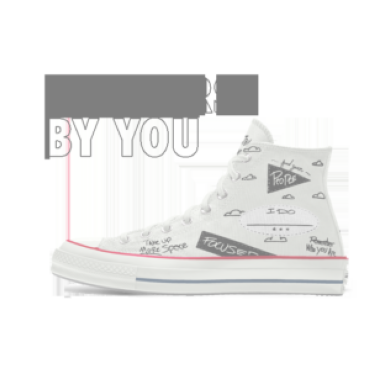

Do you like this shoe (y/n)?: n
tensor([[0.6109]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9437964558601379 tensor([[0.6109]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


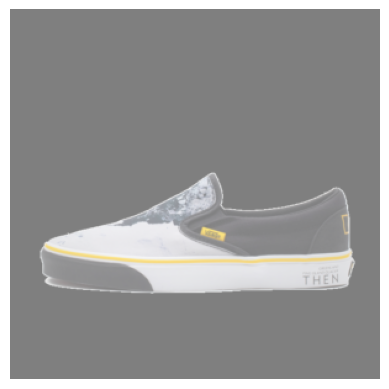

Do you like this shoe (y/n)?: n
tensor([[0.6171]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9600919485092163 tensor([[0.6171]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


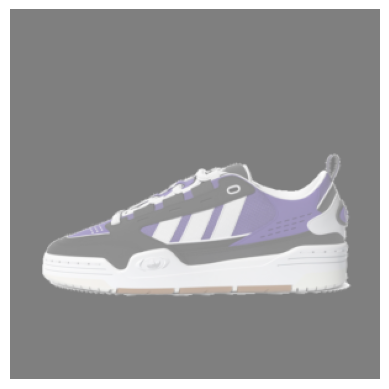

Do you like this shoe (y/n)?: y
tensor([[0.5900]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5276246070861816 tensor([[0.5900]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


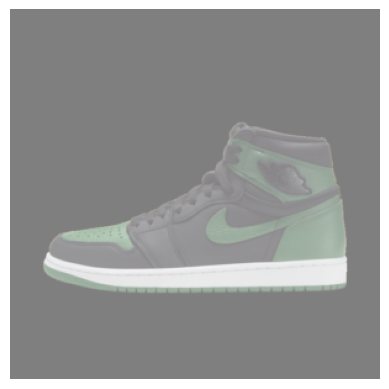

Do you like this shoe (y/n)?: y
tensor([[0.6918]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.36849603056907654 tensor([[0.6918]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


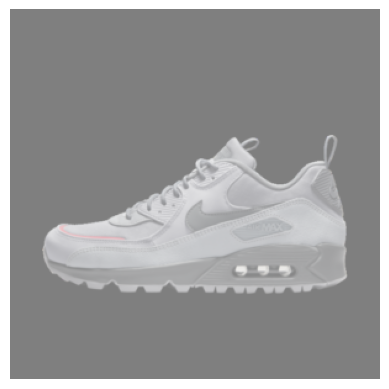

Do you like this shoe (y/n)?: y
tensor([[0.6540]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.42467984557151794 tensor([[0.6540]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


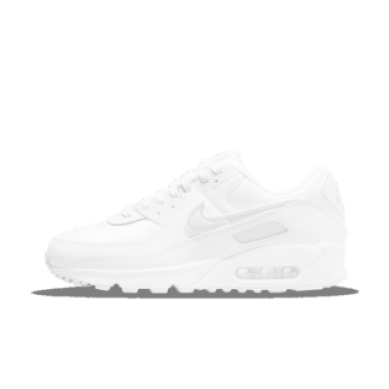

Do you like this shoe (y/n)?: y
tensor([[0.6270]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4668664038181305 tensor([[0.6270]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


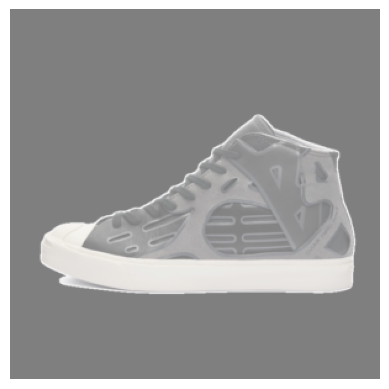

Do you like this shoe (y/n)?: n
tensor([[0.6380]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0162484645843506 tensor([[0.6380]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


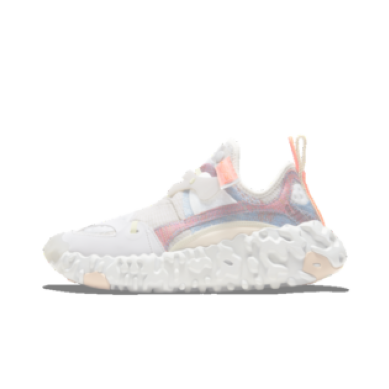

Do you like this shoe (y/n)?: y
tensor([[0.6030]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5058709979057312 tensor([[0.6030]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


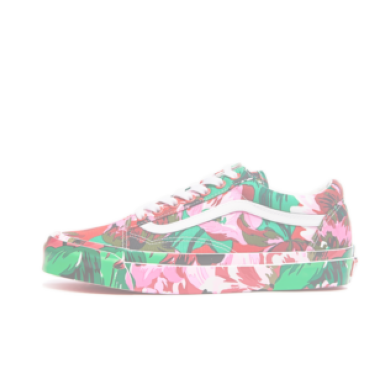

Do you like this shoe (y/n)?: n
tensor([[0.5159]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7254630923271179 tensor([[0.5159]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


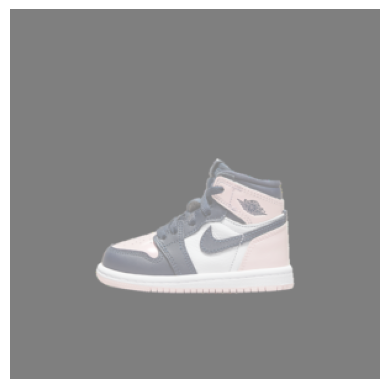

Do you like this shoe (y/n)?: n
tensor([[0.5611]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8235787749290466 tensor([[0.5611]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


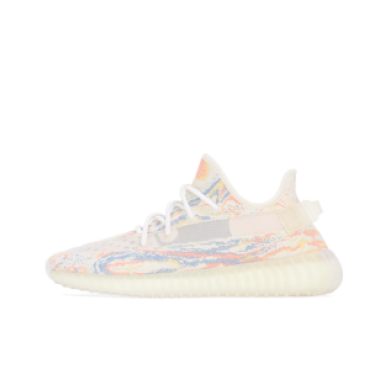

Do you like this shoe (y/n)?: y
tensor([[0.5751]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5531592965126038 tensor([[0.5751]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


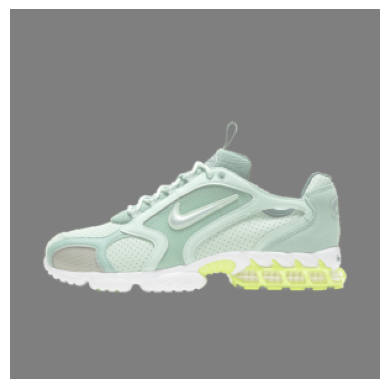

Do you like this shoe (y/n)?: y
tensor([[0.6522]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.42742982506752014 tensor([[0.6522]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


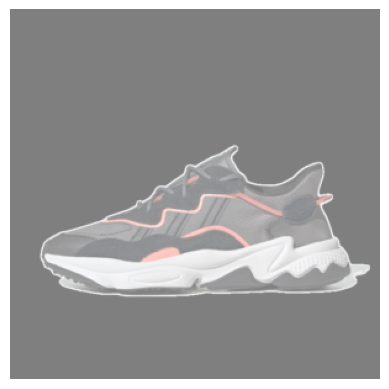

Do you like this shoe (y/n)?: y
tensor([[0.6363]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4520385265350342 tensor([[0.6363]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


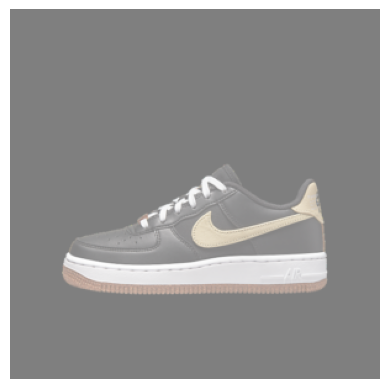

Do you like this shoe (y/n)?: y
tensor([[0.5667]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5678699016571045 tensor([[0.5667]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


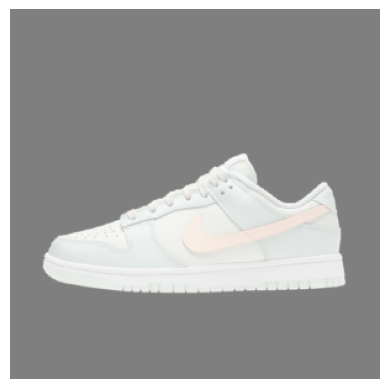

Do you like this shoe (y/n)?: n
tensor([[0.6157]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9562767148017883 tensor([[0.6157]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


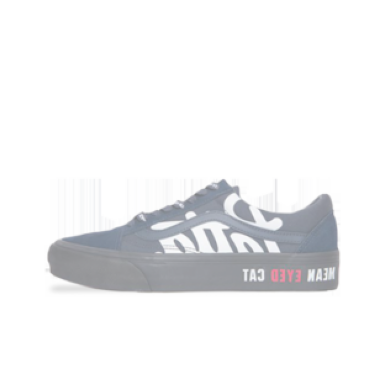

Do you like this shoe (y/n)?: n
tensor([[0.5382]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7726089954376221 tensor([[0.5382]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


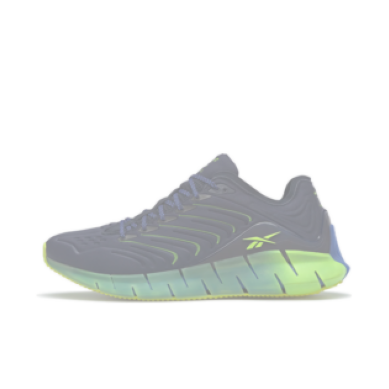

Do you like this shoe (y/n)?: n
tensor([[0.4386]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5773824453353882 tensor([[0.4386]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


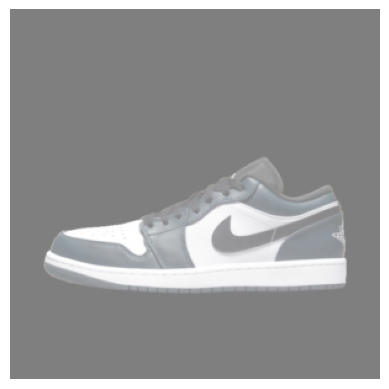

Do you like this shoe (y/n)?: y
tensor([[0.6398]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.44660401344299316 tensor([[0.6398]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


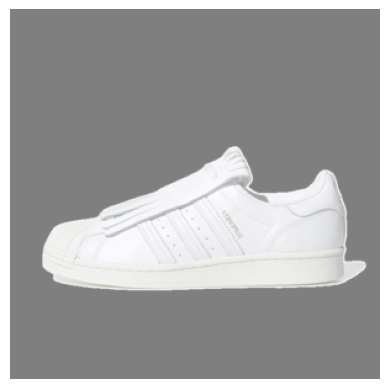

Do you like this shoe (y/n)?: n
tensor([[0.6422]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.0279191732406616 tensor([[0.6422]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


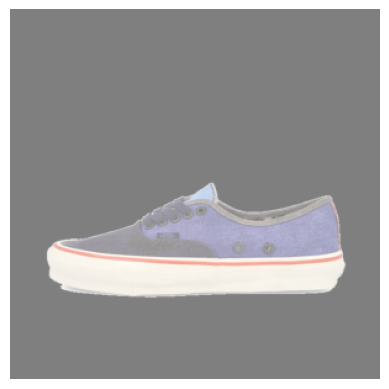

Do you like this shoe (y/n)?: n
tensor([[0.5947]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9032144546508789 tensor([[0.5947]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


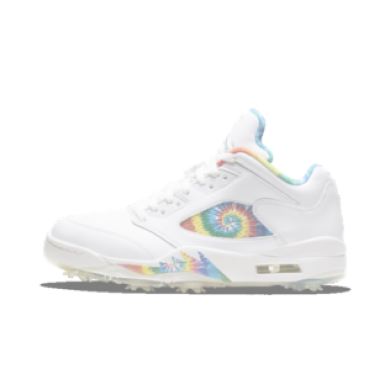

Do you like this shoe (y/n)?: y
tensor([[0.6801]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.3855844736099243 tensor([[0.6801]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


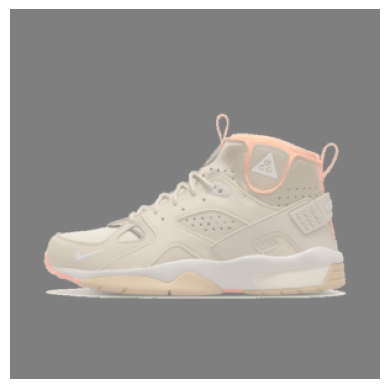

Do you like this shoe (y/n)?: y
tensor([[0.7118]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.3399275243282318 tensor([[0.7118]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


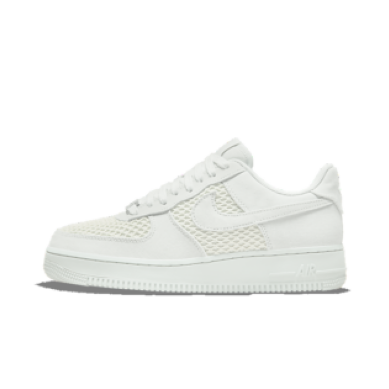

Do you like this shoe (y/n)?: y
tensor([[0.5483]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.60089111328125 tensor([[0.5483]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


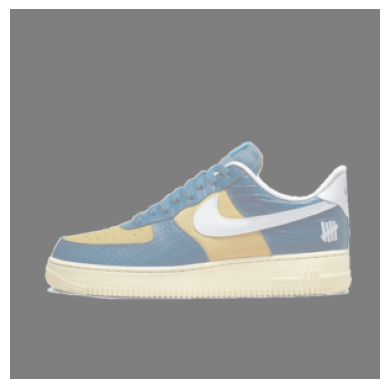

Do you like this shoe (y/n)?: y
tensor([[0.6323]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4583524465560913 tensor([[0.6323]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


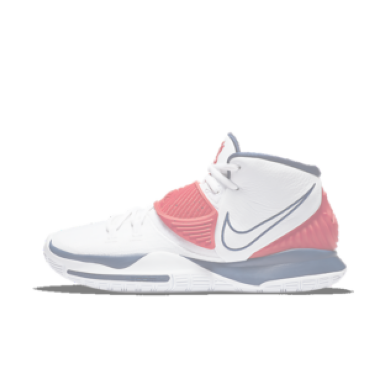

Do you like this shoe (y/n)?: n
tensor([[0.5858]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8812903165817261 tensor([[0.5858]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


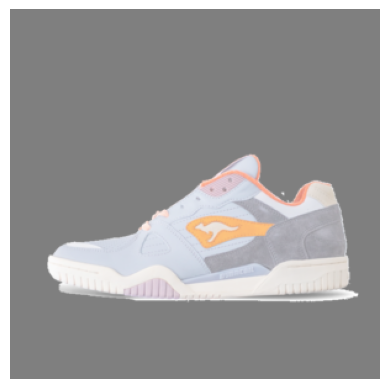

Do you like this shoe (y/n)?: n
tensor([[0.6356]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.009499430656433 tensor([[0.6356]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


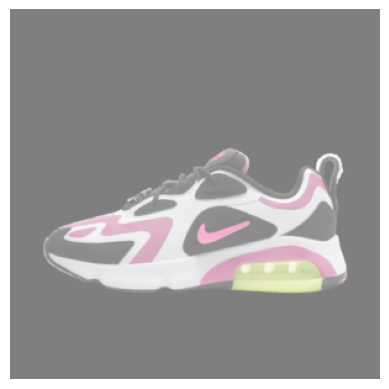

Do you like this shoe (y/n)?: y
tensor([[0.5762]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5512270927429199 tensor([[0.5762]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


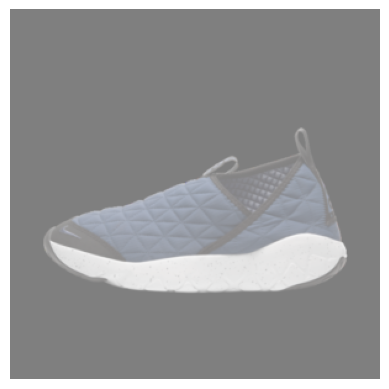

Do you like this shoe (y/n)?: n
tensor([[0.7004]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.2051984071731567 tensor([[0.7004]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


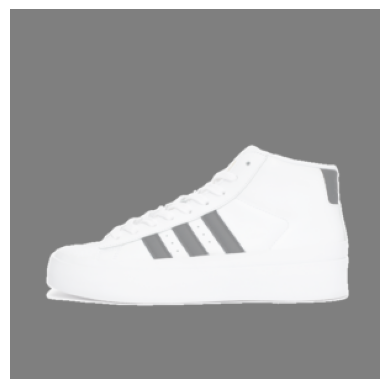

Do you like this shoe (y/n)?: n
tensor([[0.6792]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.1370015144348145 tensor([[0.6792]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


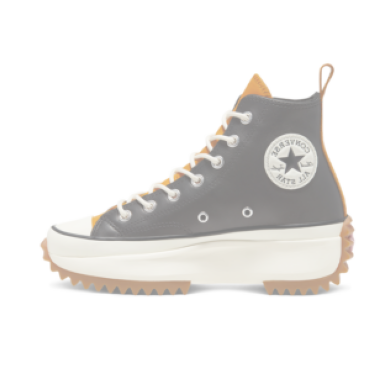

Do you like this shoe (y/n)?: n
tensor([[0.4470]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5923360586166382 tensor([[0.4470]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


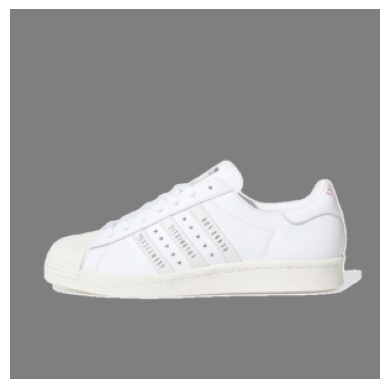

Do you like this shoe (y/n)?: n
tensor([[0.5790]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8652201294898987 tensor([[0.5790]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


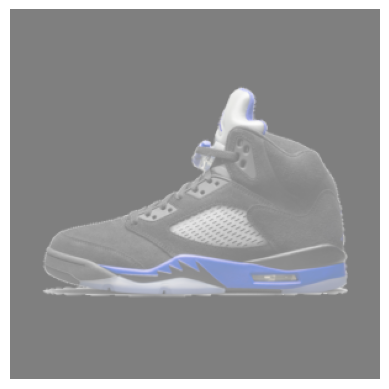

Do you like this shoe (y/n)?: y
tensor([[0.5559]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.587081789970398 tensor([[0.5559]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


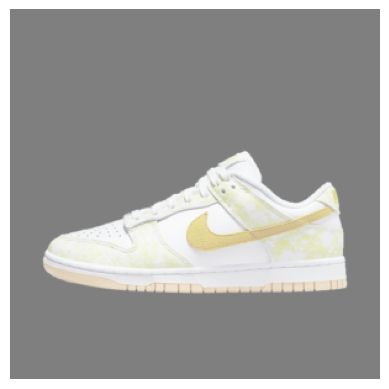

Do you like this shoe (y/n)?: y
tensor([[0.5433]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6101369261741638 tensor([[0.5433]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


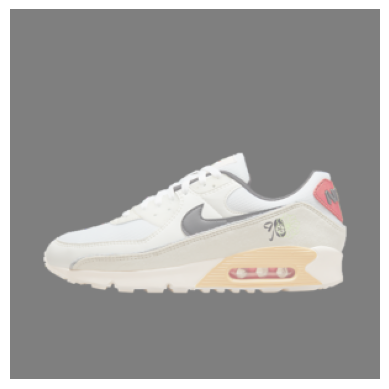

Do you like this shoe (y/n)?: y
tensor([[0.6351]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.4540087580680847 tensor([[0.6351]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


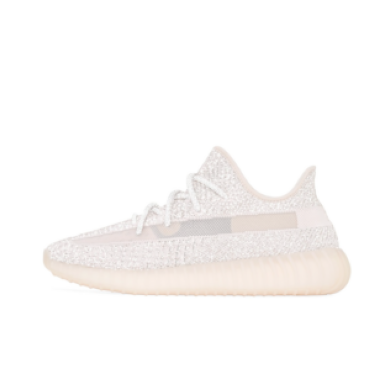

Do you like this shoe (y/n)?: y
tensor([[0.4546]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.788249671459198 tensor([[0.4546]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


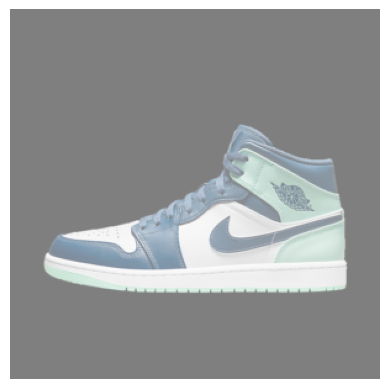

Do you like this shoe (y/n)?: n
tensor([[0.6180]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9622049331665039 tensor([[0.6180]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


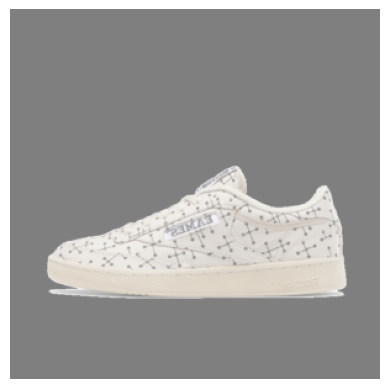

Do you like this shoe (y/n)?: n
tensor([[0.5907]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8932433128356934 tensor([[0.5907]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


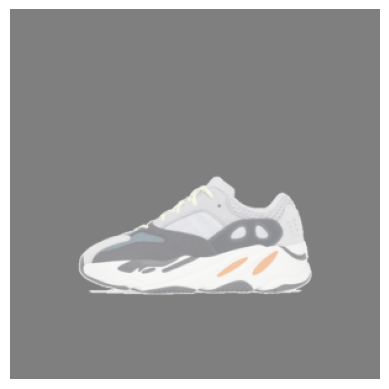

Do you like this shoe (y/n)?: n
tensor([[0.4759]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6461408138275146 tensor([[0.4759]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


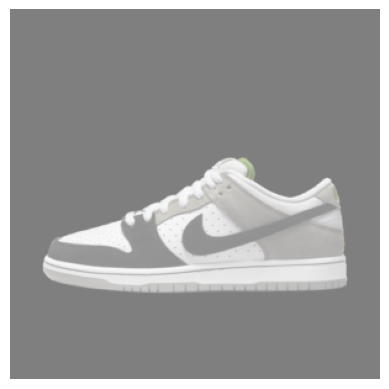

Do you like this shoe (y/n)?: y
tensor([[0.5929]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5227212309837341 tensor([[0.5929]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


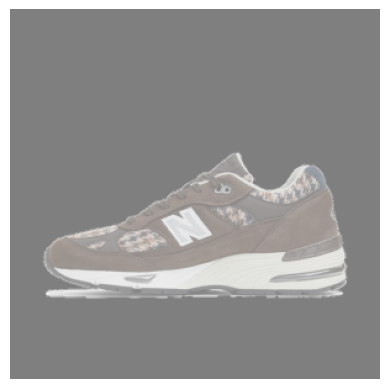

Do you like this shoe (y/n)?: y
tensor([[0.6151]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.48596853017807007 tensor([[0.6151]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


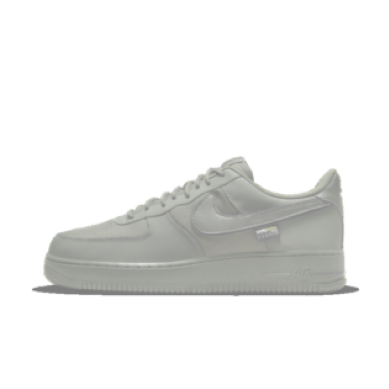

Do you like this shoe (y/n)?: y
tensor([[0.5261]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6423003673553467 tensor([[0.5261]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


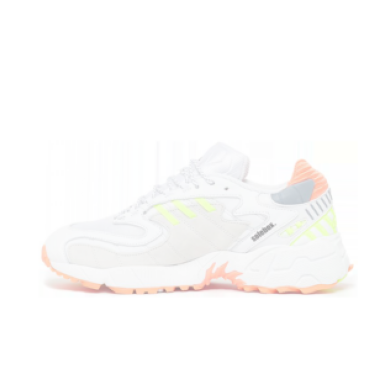

Do you like this shoe (y/n)?: n
tensor([[0.6804]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
1.1406487226486206 tensor([[0.6804]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


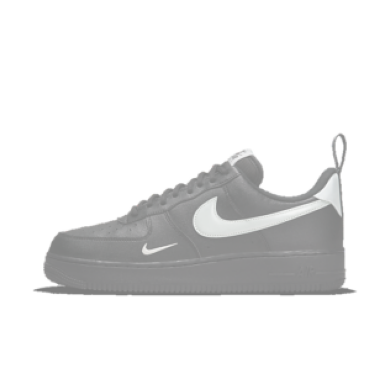

Do you like this shoe (y/n)?: y
tensor([[0.4124]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8858367204666138 tensor([[0.4124]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


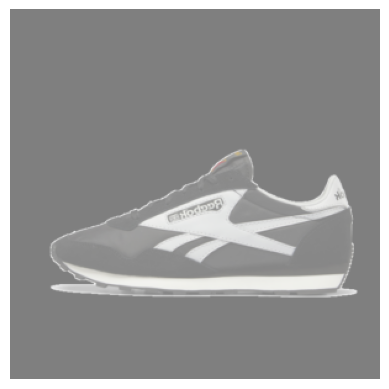

Do you like this shoe (y/n)?: n
tensor([[0.4940]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6812926530838013 tensor([[0.4940]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


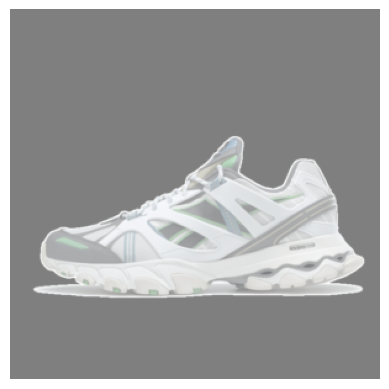

Do you like this shoe (y/n)?: n
tensor([[0.6093]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9397903084754944 tensor([[0.6093]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


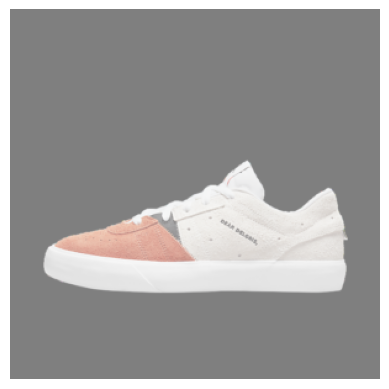

Do you like this shoe (y/n)?: n
tensor([[0.5237]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.741752564907074 tensor([[0.5237]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


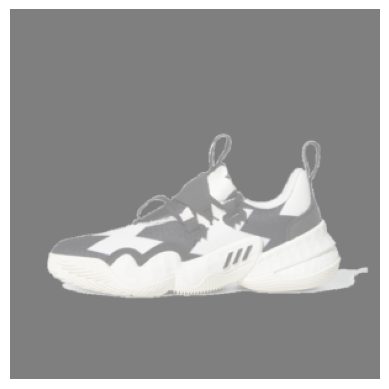

Do you like this shoe (y/n)?: n
tensor([[0.6291]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9918234944343567 tensor([[0.6291]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


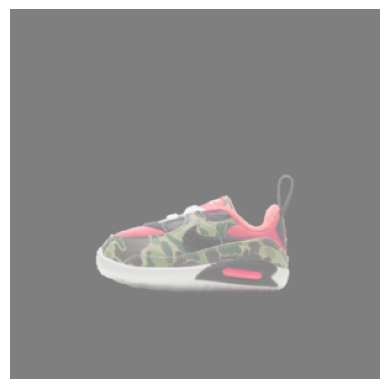

Do you like this shoe (y/n)?: n
tensor([[0.4005]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5116980075836182 tensor([[0.4005]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


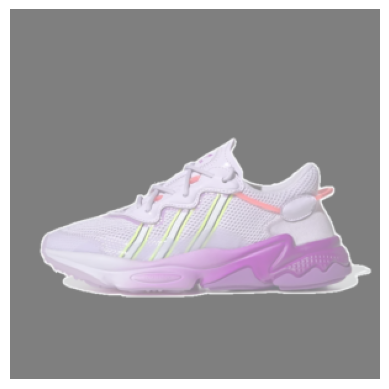

Do you like this shoe (y/n)?: n
tensor([[0.6262]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9839242696762085 tensor([[0.6262]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


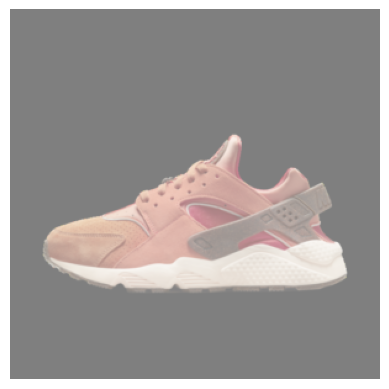

Do you like this shoe (y/n)?: n
tensor([[0.6207]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9695062637329102 tensor([[0.6207]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


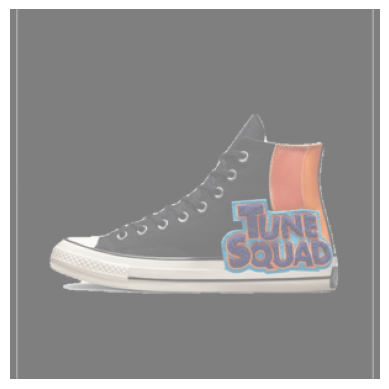

Do you like this shoe (y/n)?: n
tensor([[0.5197]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7333304286003113 tensor([[0.5197]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


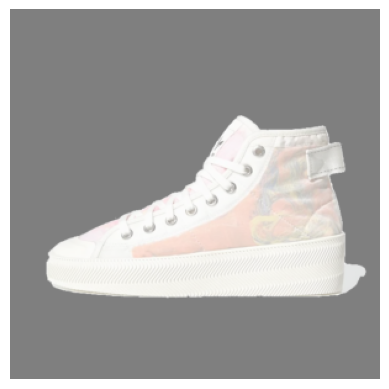

Do you like this shoe (y/n)?: n
tensor([[0.5221]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7383725643157959 tensor([[0.5221]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


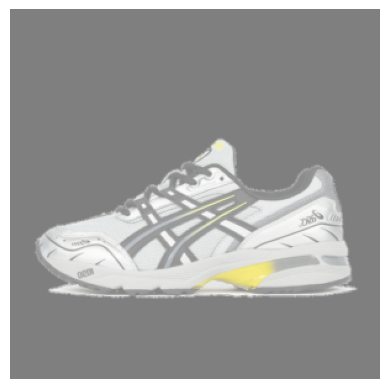

Do you like this shoe (y/n)?: n
tensor([[0.5716]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8477746248245239 tensor([[0.5716]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


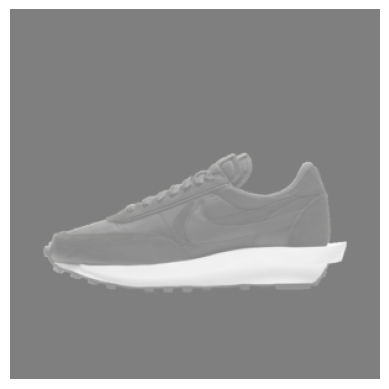

Do you like this shoe (y/n)?: y
tensor([[0.4896]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7140793204307556 tensor([[0.4896]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


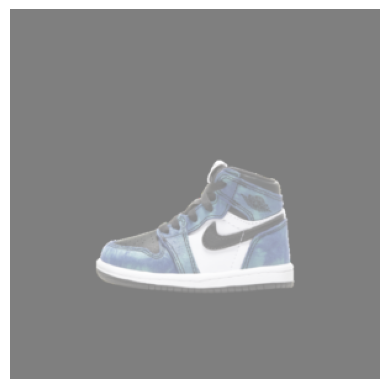

Do you like this shoe (y/n)?: n
tensor([[0.3845]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4852409362792969 tensor([[0.3845]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


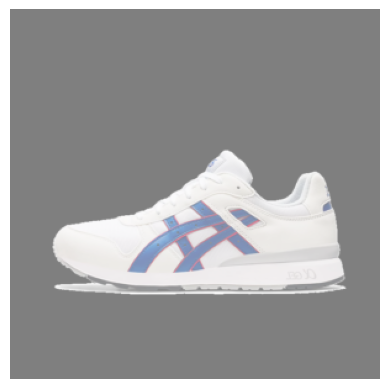

Do you like this shoe (y/n)?: n
tensor([[0.4817]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6571516394615173 tensor([[0.4817]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


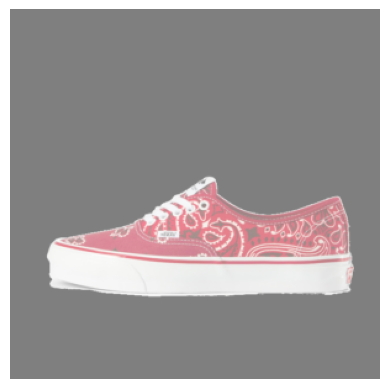

Do you like this shoe (y/n)?: n
tensor([[0.3623]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.44989168643951416 tensor([[0.3623]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


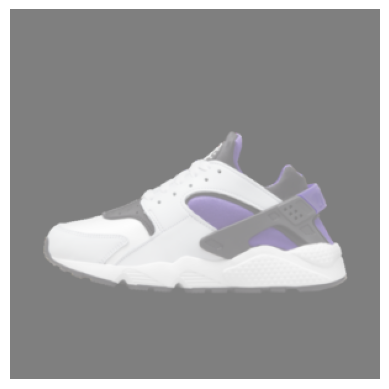

Do you like this shoe (y/n)?: n
tensor([[0.5458]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7892923951148987 tensor([[0.5458]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


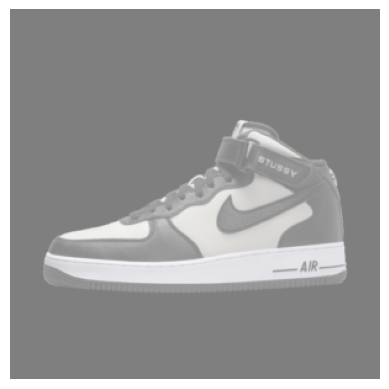

Do you like this shoe (y/n)?: n
tensor([[0.4743]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6431097388267517 tensor([[0.4743]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


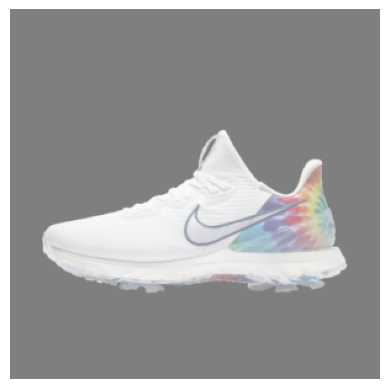

Do you like this shoe (y/n)?: y
tensor([[0.4791]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.735788106918335 tensor([[0.4791]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


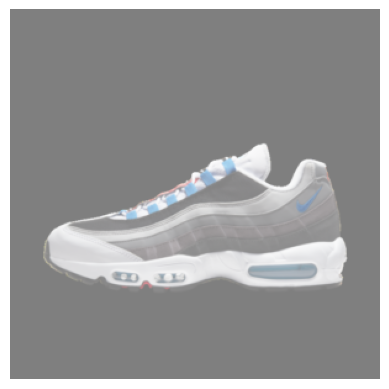

Do you like this shoe (y/n)?: y
tensor([[0.4683]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.758738100528717 tensor([[0.4683]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


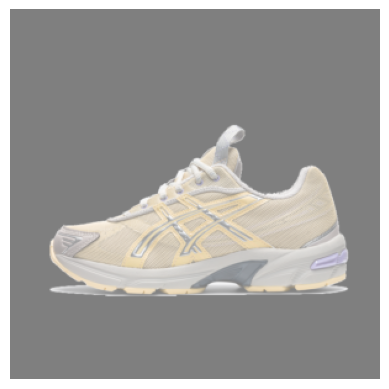

Do you like this shoe (y/n)?: n
tensor([[0.4621]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6201589703559875 tensor([[0.4621]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


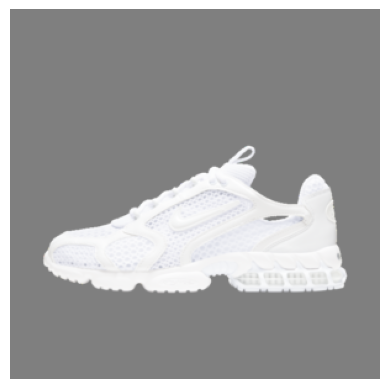

Do you like this shoe (y/n)?: 
Do you like this shoe (y/n)?: n
tensor([[0.4521]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6016883850097656 tensor([[0.4521]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


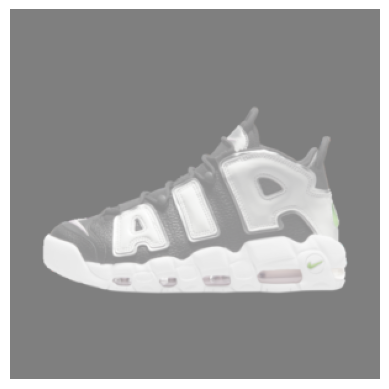

Do you like this shoe (y/n)?: y
tensor([[0.5267]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6410645842552185 tensor([[0.5267]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


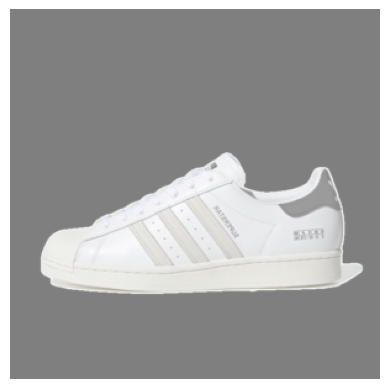

Do you like this shoe (y/n)?: n
tensor([[0.4511]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5999289155006409 tensor([[0.4511]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


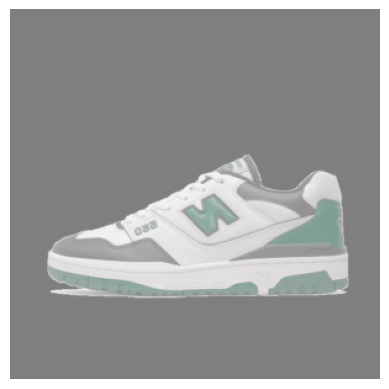

Do you like this shoe (y/n)?: y
tensor([[0.3852]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9540745615959167 tensor([[0.3852]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


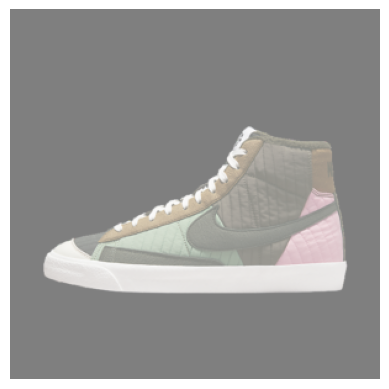

Do you like this shoe (y/n)?: n
tensor([[0.3932]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.49956971406936646 tensor([[0.3932]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


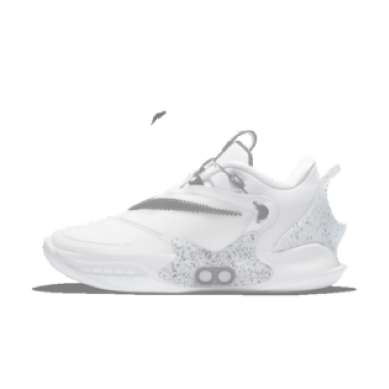

Do you like this shoe (y/n)?: n
tensor([[0.5611]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8234777450561523 tensor([[0.5611]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


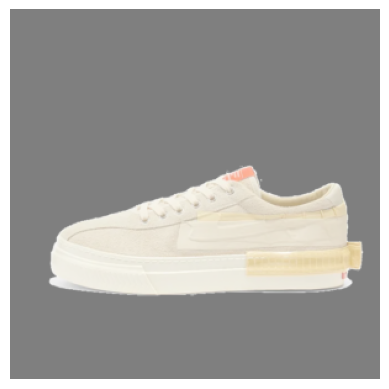

Do you like this shoe (y/n)?: n
tensor([[0.4276]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5578697919845581 tensor([[0.4276]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


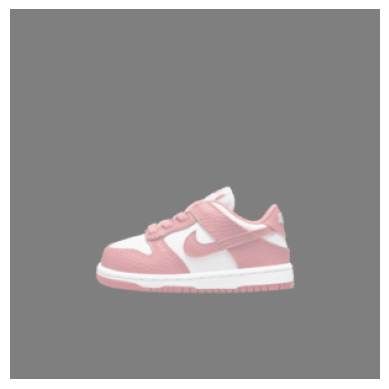

Do you like this shoe (y/n)?: n
tensor([[0.2568]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.2967630624771118 tensor([[0.2568]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


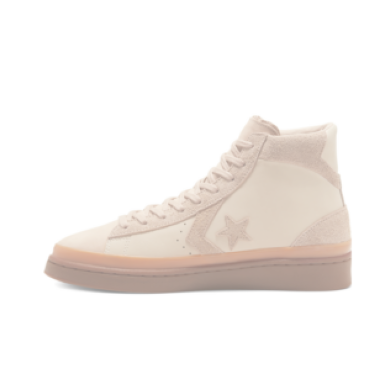

Do you like this shoe (y/n)?: n
tensor([[0.5386]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7735884189605713 tensor([[0.5386]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


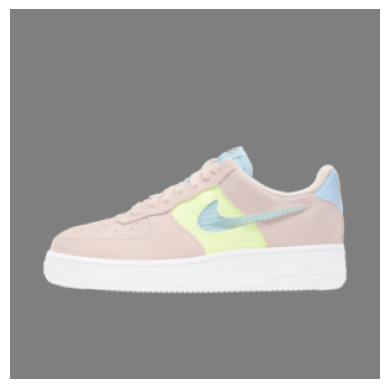

Do you like this shoe (y/n)?: n
tensor([[0.3938]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5004722476005554 tensor([[0.3938]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


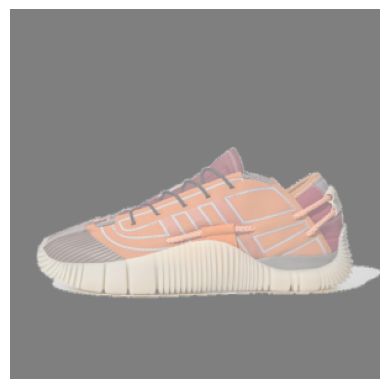

Do you like this shoe (y/n)?: n
tensor([[0.3773]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4737151861190796 tensor([[0.3773]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


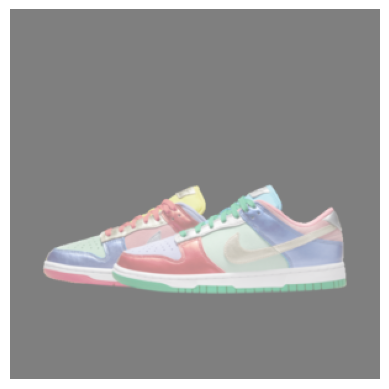

Do you like this shoe (y/n)?: n
tensor([[0.3250]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.39302557706832886 tensor([[0.3250]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


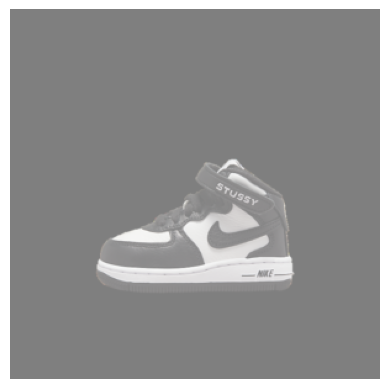

Do you like this shoe (y/n)?: n
tensor([[0.3024]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.3601705729961395 tensor([[0.3024]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


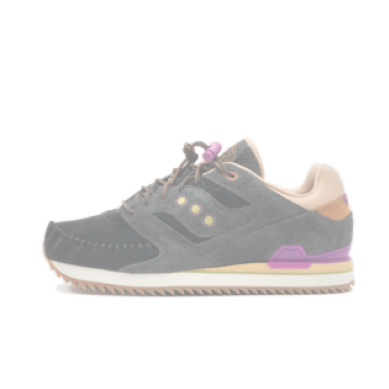

Do you like this shoe (y/n)?: n
tensor([[0.3890]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.49259305000305176 tensor([[0.3890]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


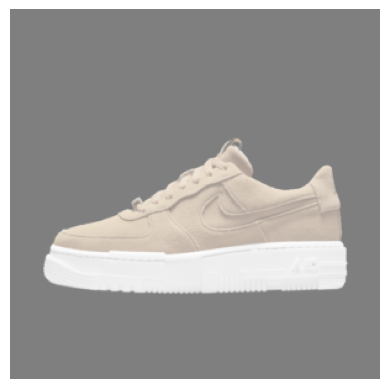

Do you like this shoe (y/n)?: n
tensor([[0.4049]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5190529823303223 tensor([[0.4049]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


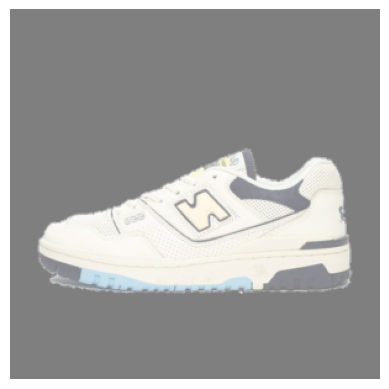

Do you like this shoe (y/n)?: y
tensor([[0.3921]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9363278746604919 tensor([[0.3921]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


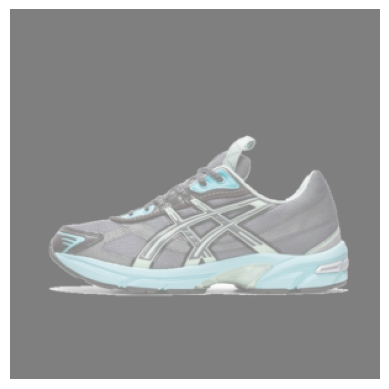

Do you like this shoe (y/n)?: n
tensor([[0.3713]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4641617238521576 tensor([[0.3713]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


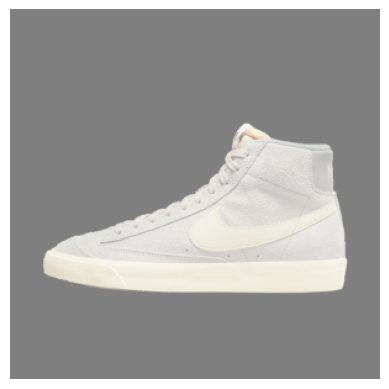

Do you like this shoe (y/n)?: n
tensor([[0.3499]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.43057531118392944 tensor([[0.3499]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


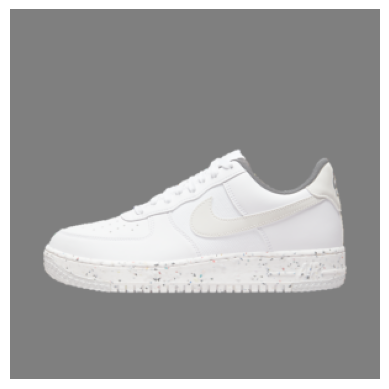

Do you like this shoe (y/n)?: y
tensor([[0.3734]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9851152300834656 tensor([[0.3734]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


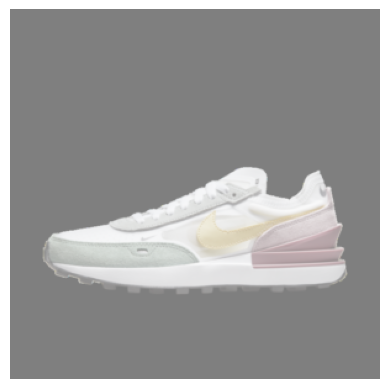

Do you like this shoe (y/n)?: y
tensor([[0.2972]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.2132806777954102 tensor([[0.2972]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


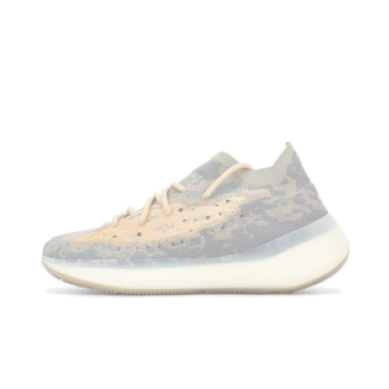

Do you like this shoe (y/n)?: y
tensor([[0.4368]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8282885551452637 tensor([[0.4368]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


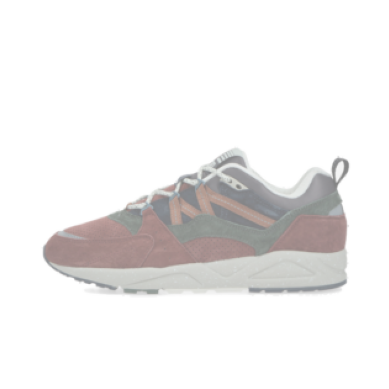

Do you like this shoe (y/n)?: n
tensor([[0.3739]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4682695269584656 tensor([[0.3739]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


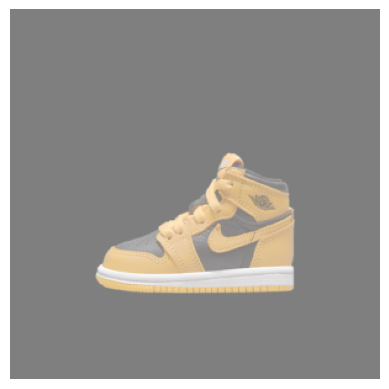

Do you like this shoe (y/n)?: y
tensor([[0.2981]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.2103232145309448 tensor([[0.2981]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


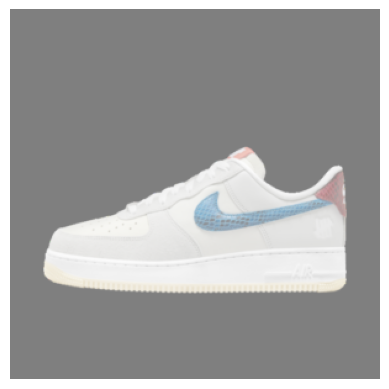

Do you like this shoe (y/n)?: y
tensor([[0.3542]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.0378761291503906 tensor([[0.3542]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


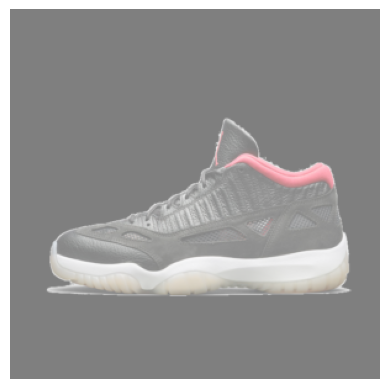

Do you like this shoe (y/n)?: n
tensor([[0.3742]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4686739444732666 tensor([[0.3742]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


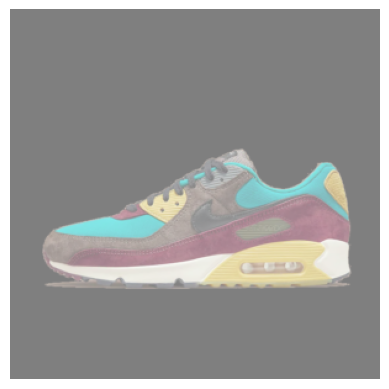

Do you like this shoe (y/n)?: y
tensor([[0.3618]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.0166490077972412 tensor([[0.3618]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


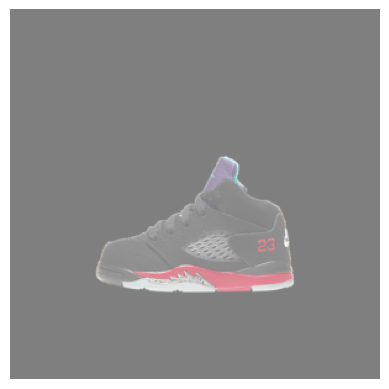

Do you like this shoe (y/n)?: n
tensor([[0.3030]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.360956609249115 tensor([[0.3030]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


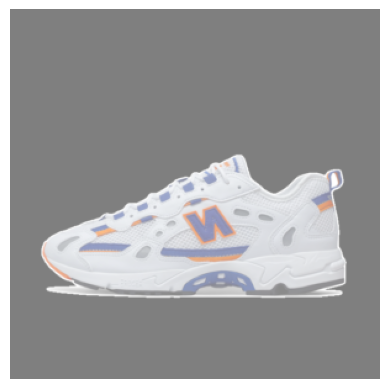

Do you like this shoe (y/n)?: n
tensor([[0.3428]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4198315441608429 tensor([[0.3428]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


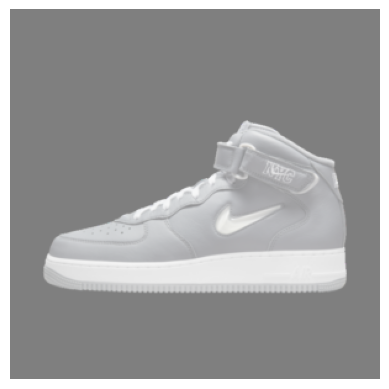

Do you like this shoe (y/n)?: y
tensor([[0.3637]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.0113916397094727 tensor([[0.3637]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


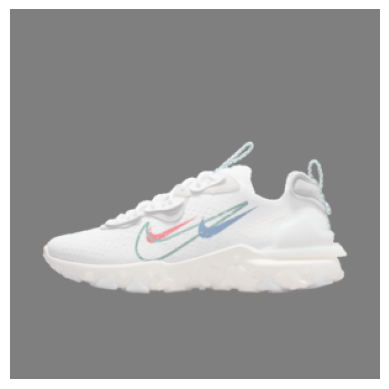

Do you like this shoe (y/n)?: y
tensor([[0.2925]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.229313611984253 tensor([[0.2925]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


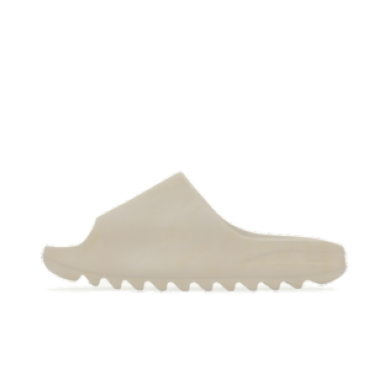

Do you like this shoe (y/n)?: n
tensor([[0.4174]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5403019189834595 tensor([[0.4174]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


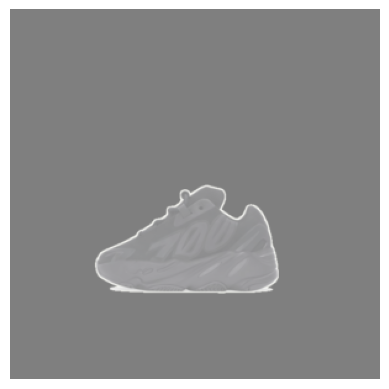

Do you like this shoe (y/n)?: n
tensor([[0.4031]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5160558223724365 tensor([[0.4031]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


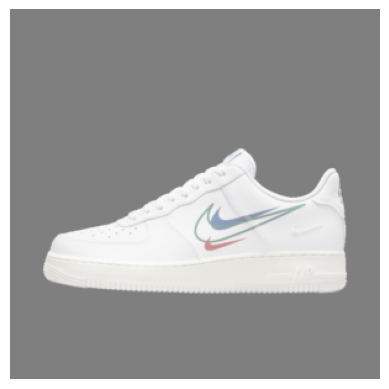

Do you like this shoe (y/n)?: y
tensor([[0.3824]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9611858129501343 tensor([[0.3824]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


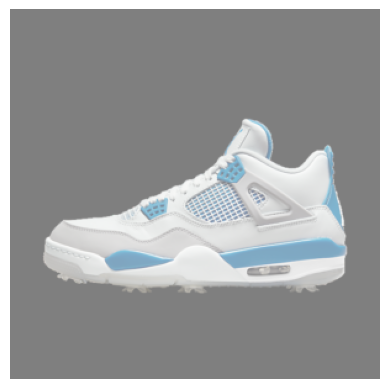

Do you like this shoe (y/n)?: y
tensor([[0.3735]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9848789572715759 tensor([[0.3735]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


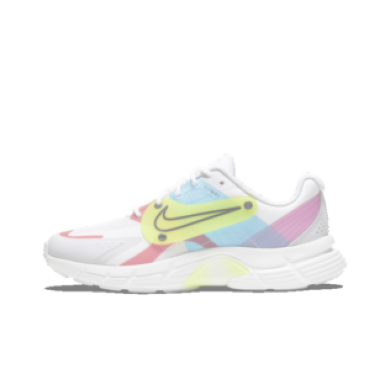

Do you like this shoe (y/n)?: y
tensor([[0.3025]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.1955863237380981 tensor([[0.3025]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


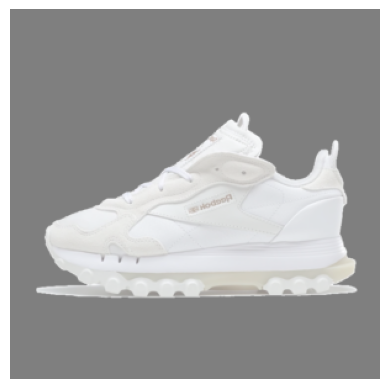

Do you like this shoe (y/n)?: n
tensor([[0.5229]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7400051355361938 tensor([[0.5229]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


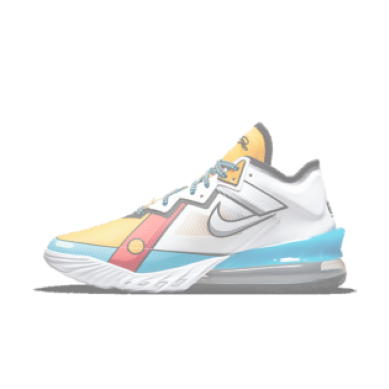

Do you like this shoe (y/n)?: y
tensor([[0.3415]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.0745456218719482 tensor([[0.3415]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


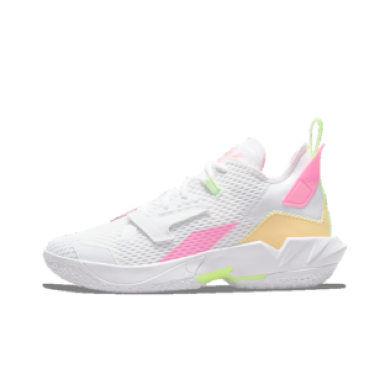

Do you like this shoe (y/n)?: n
tensor([[0.5017]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6964923143386841 tensor([[0.5017]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


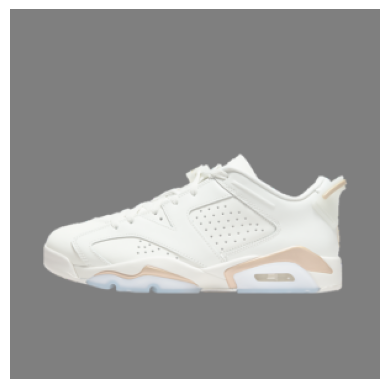

Do you like this shoe (y/n)?: y
tensor([[0.3837]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9578654170036316 tensor([[0.3837]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


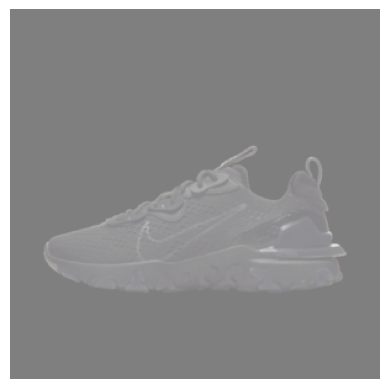

Do you like this shoe (y/n)?: y
tensor([[0.3501]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.0494574308395386 tensor([[0.3501]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


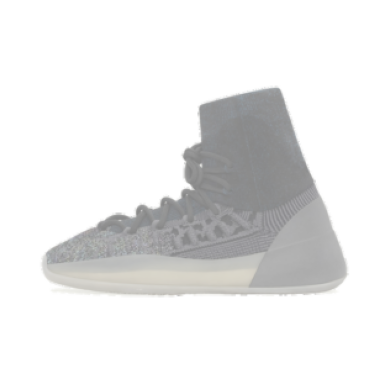

Do you like this shoe (y/n)?: n
tensor([[0.4899]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6730650067329407 tensor([[0.4899]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


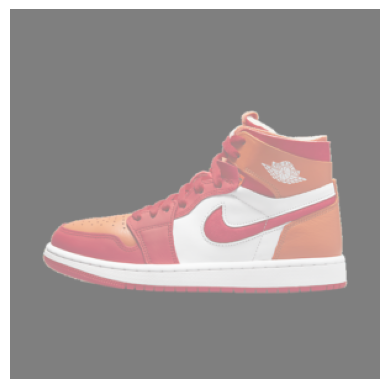

Do you like this shoe (y/n)?: y
tensor([[0.3817]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9630712866783142 tensor([[0.3817]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


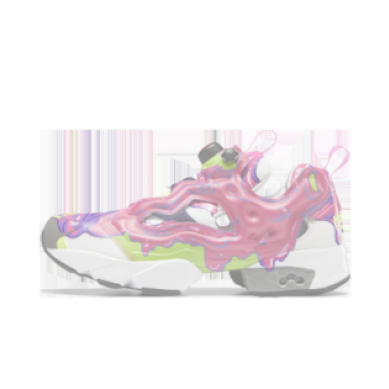

Do you like this shoe (y/n)?: n
tensor([[0.4200]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5447124242782593 tensor([[0.4200]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


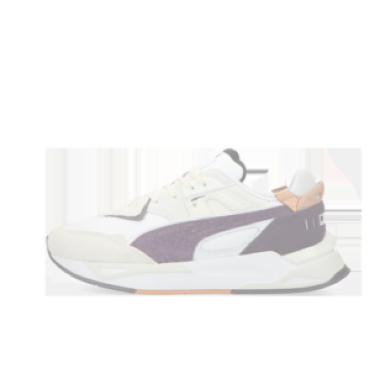

Do you like this shoe (y/n)?: n
tensor([[0.3979]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5072810053825378 tensor([[0.3979]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


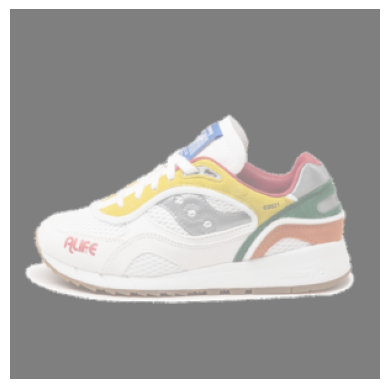

Do you like this shoe (y/n)?: n
tensor([[0.5199]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.733728289604187 tensor([[0.5199]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


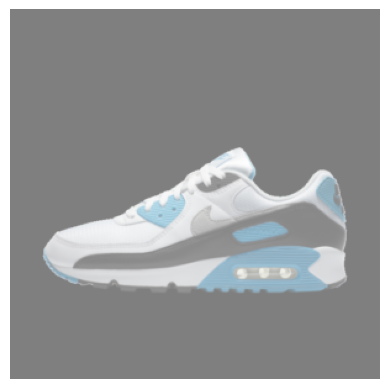

Do you like this shoe (y/n)?: yy
tensor([[0.4267]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8516393899917603 tensor([[0.4267]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


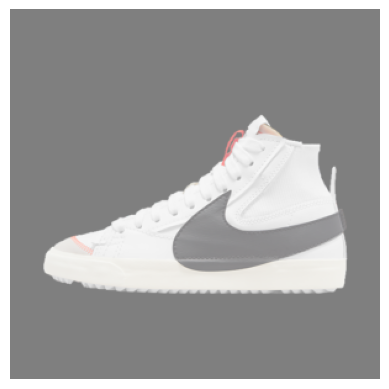

Do you like this shoe (y/n)?: n
tensor([[0.3976]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5068621635437012 tensor([[0.3976]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


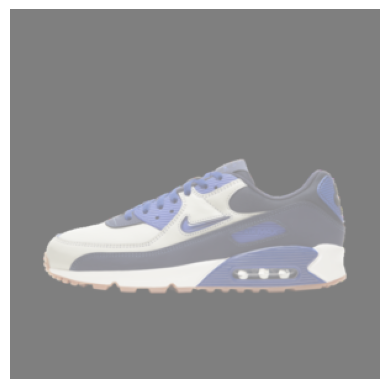

Do you like this shoe (y/n)?: yy
tensor([[0.4309]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8419259786605835 tensor([[0.4309]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


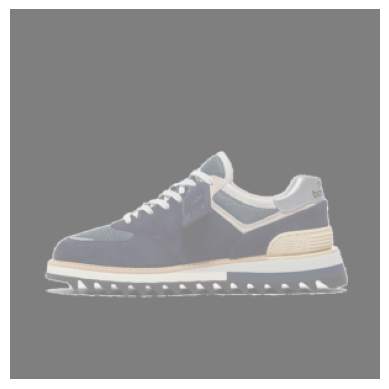

Do you like this shoe (y/n)?: y
tensor([[0.5156]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6624964475631714 tensor([[0.5156]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


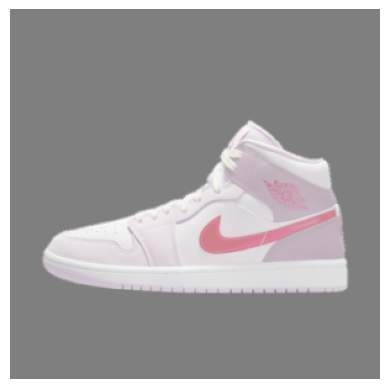

Do you like this shoe (y/n)?: n
tensor([[0.4639]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6234560608863831 tensor([[0.4639]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


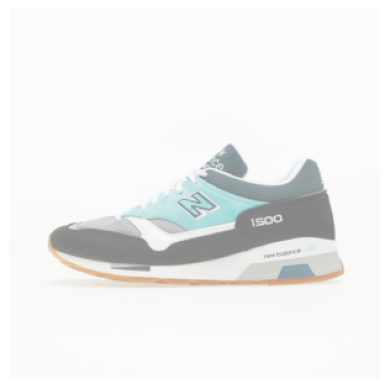

Do you like this shoe (y/n)?: y
tensor([[0.3226]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.1314163208007812 tensor([[0.3226]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


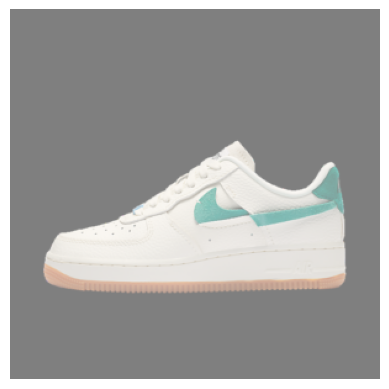

Do you like this shoe (y/n)?: yy
tensor([[0.5022]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6888431310653687 tensor([[0.5022]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


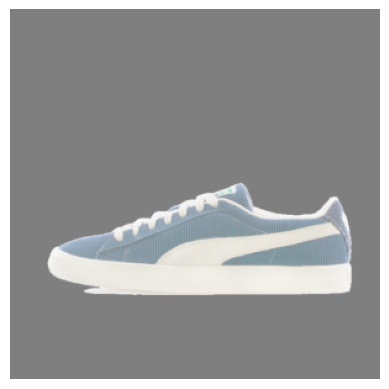

Do you like this shoe (y/n)?: yy
tensor([[0.3863]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9512619972229004 tensor([[0.3863]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


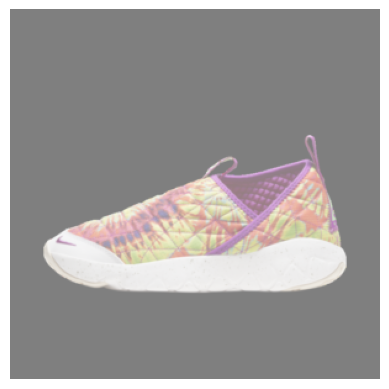

Do you like this shoe (y/n)?: n
tensor([[0.4949]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6830543875694275 tensor([[0.4949]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


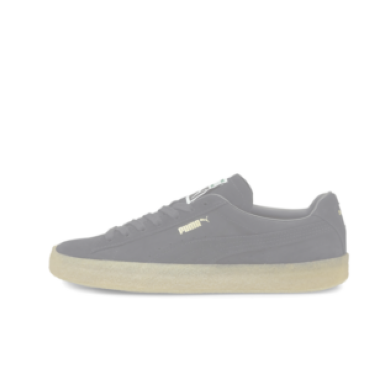

Do you like this shoe (y/n)?: n
tensor([[0.3783]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.47525182366371155 tensor([[0.3783]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


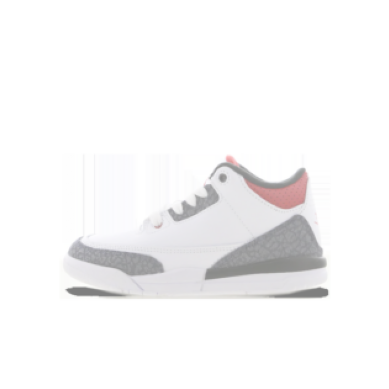

Do you like this shoe (y/n)?: n
tensor([[0.3875]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.49026763439178467 tensor([[0.3875]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


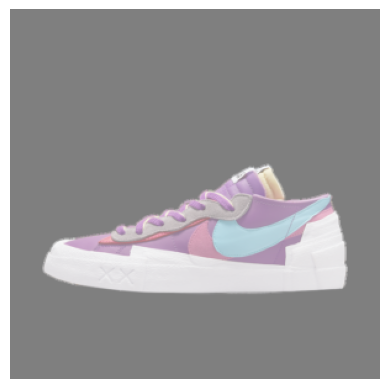

Do you like this shoe (y/n)?: n
tensor([[0.4977]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6885673403739929 tensor([[0.4977]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


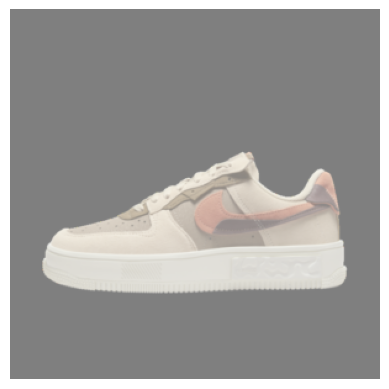

Do you like this shoe (y/n)?: n
tensor([[0.4872]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6678115725517273 tensor([[0.4872]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


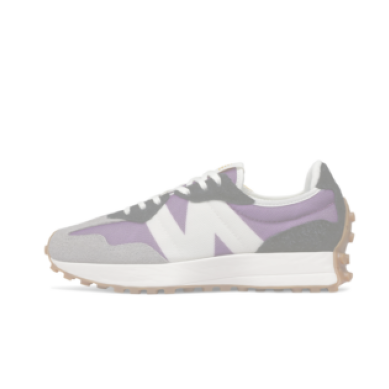

Do you like this shoe (y/n)?: y
tensor([[0.3067]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.181758165359497 tensor([[0.3067]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


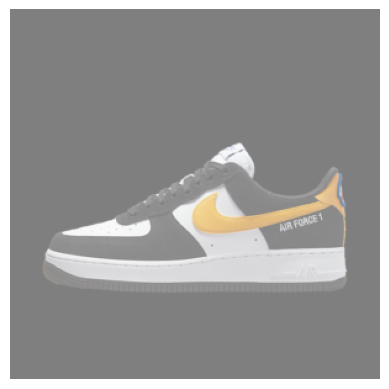

Do you like this shoe (y/n)?: y
tensor([[0.4023]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9104689955711365 tensor([[0.4023]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


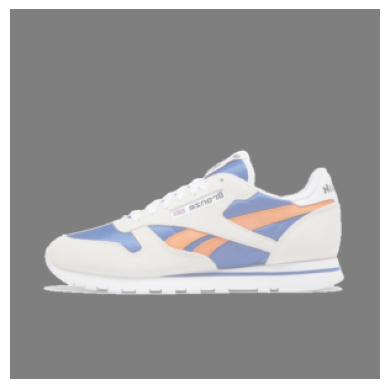

Do you like this shoe (y/n)?: n
tensor([[0.3772]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4735912084579468 tensor([[0.3772]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


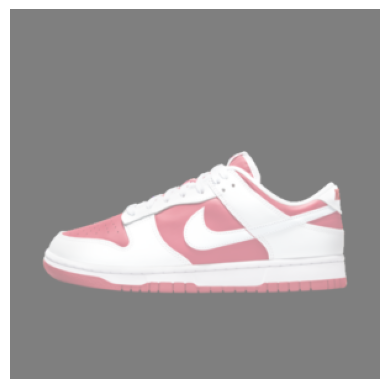

Do you like this shoe (y/n)?: y
tensor([[0.4673]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7607039213180542 tensor([[0.4673]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


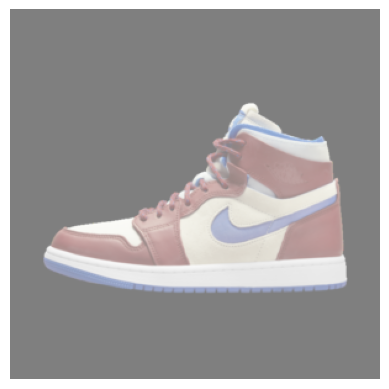

Do you like this shoe (y/n)?: yy
tensor([[0.4665]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7624450325965881 tensor([[0.4665]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


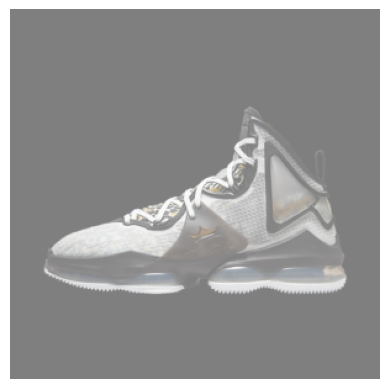

Do you like this shoe (y/n)?: yy
tensor([[0.4107]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8897886276245117 tensor([[0.4107]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


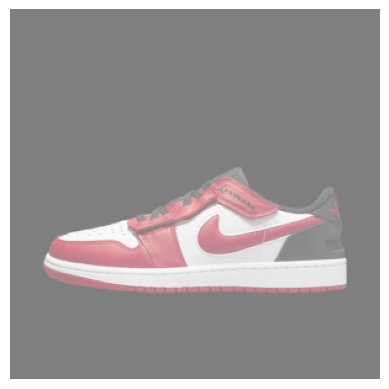

Do you like this shoe (y/n)?: n
tensor([[0.3797]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.477567195892334 tensor([[0.3797]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


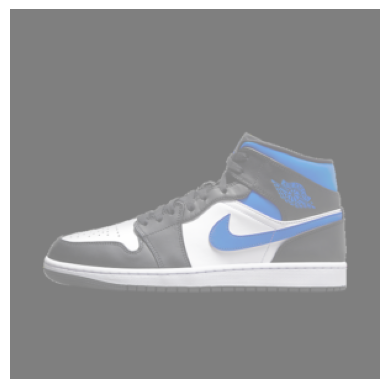

Do you like this shoe (y/n)?: yy
tensor([[0.4429]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8144255876541138 tensor([[0.4429]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


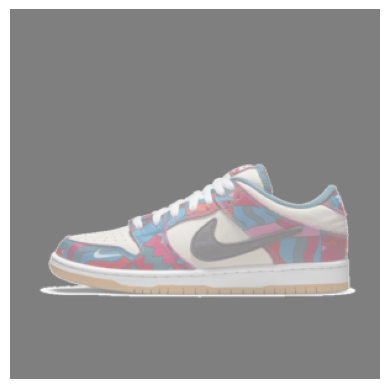

Do you like this shoe (y/n)?: y
tensor([[0.4672]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7609913945198059 tensor([[0.4672]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


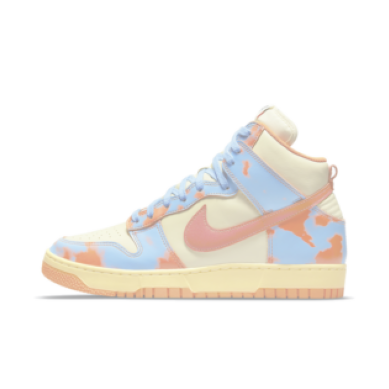

Do you like this shoe (y/n)?: yy
tensor([[0.4213]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8644465804100037 tensor([[0.4213]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


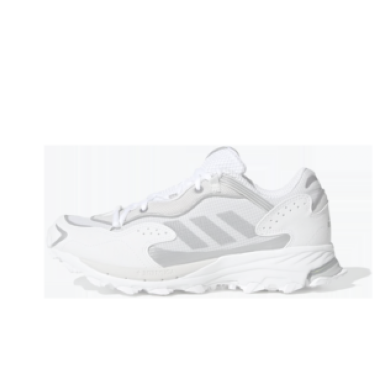

Do you like this shoe (y/n)?: n
tensor([[0.4113]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5298042893409729 tensor([[0.4113]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


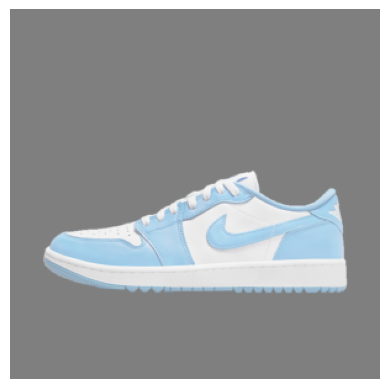

Do you like this shoe (y/n)?: yy
tensor([[0.4750]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7444980144500732 tensor([[0.4750]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


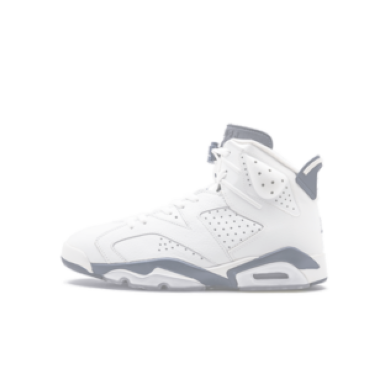

Do you like this shoe (y/n)?: yy
tensor([[0.5830]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5396301746368408 tensor([[0.5830]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


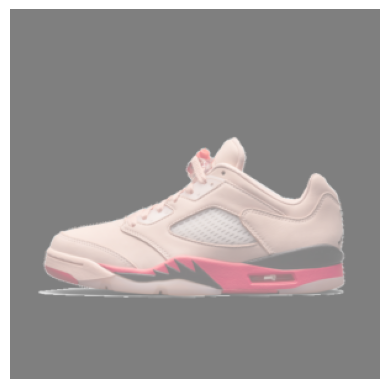

Do you like this shoe (y/n)?: yy
tensor([[0.4672]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7609370946884155 tensor([[0.4672]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


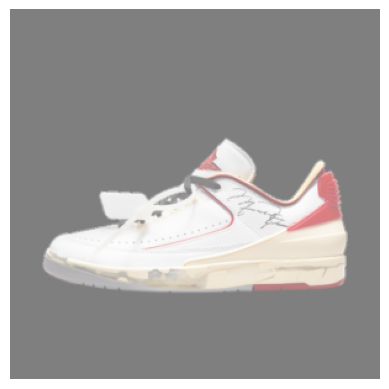

Do you like this shoe (y/n)?: y
tensor([[0.4863]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7208277583122253 tensor([[0.4863]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


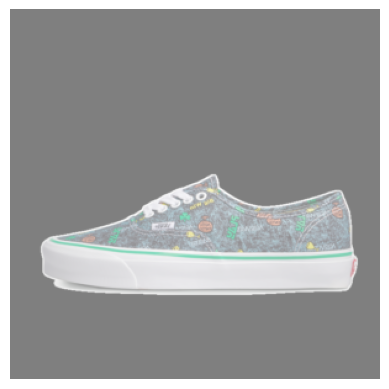

Do you like this shoe (y/n)?: n
tensor([[0.4543]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6056974530220032 tensor([[0.4543]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


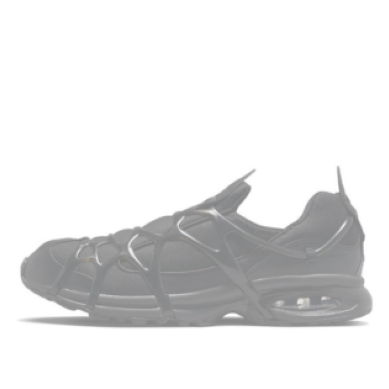

Do you like this shoe (y/n)?: n
tensor([[0.4091]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5261827111244202 tensor([[0.4091]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


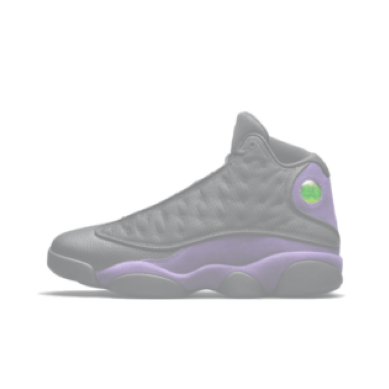

Do you like this shoe (y/n)?: y
tensor([[0.5511]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5959089398384094 tensor([[0.5511]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


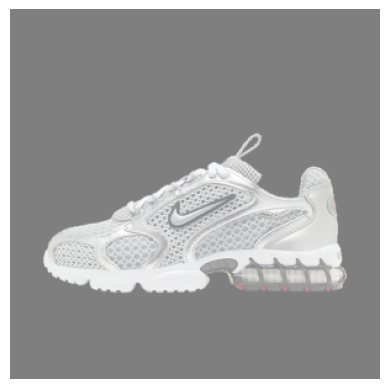

Do you like this shoe (y/n)?: n
tensor([[0.5582]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8170068860054016 tensor([[0.5582]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


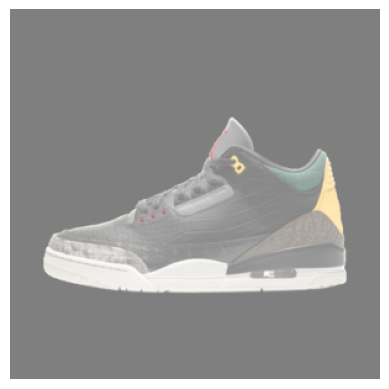

Do you like this shoe (y/n)?: n
tensor([[0.6293]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.9924819469451904 tensor([[0.6293]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


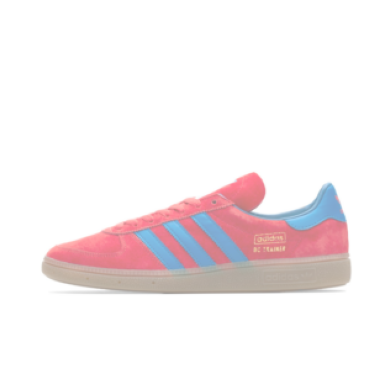

Do you like this shoe (y/n)?: n
tensor([[0.4436]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5862776637077332 tensor([[0.4436]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


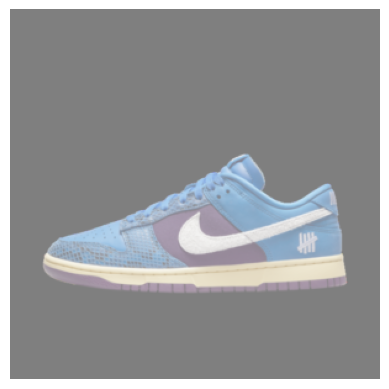

Do you like this shoe (y/n)?: yy
tensor([[0.5131]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6673150062561035 tensor([[0.5131]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


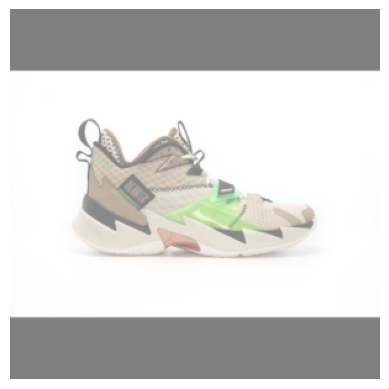

Do you like this shoe (y/n)?: q


In [155]:
for i,data in enumerate(trainLoader):
    image = data
    optimiser.zero_grad()
    
    imshow(torchvision.utils.make_grid(image))
    
    label = getLabel()
    if label == 'q': break
    
    output = net(image)
    print(output,label)
    loss = criterion(output,label)
    loss.backward()
    optimiser.step()
    
    print(loss.item(),output,label)

In [156]:
testData = CustomDataset('data/testData',transform)
testLoader = torch.utils.data.DataLoader(testData,batch_size=1,shuffle=True)

In [157]:
testSampler = iter(testLoader)

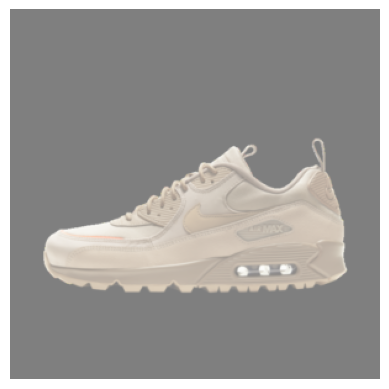

In [161]:
tImages = next(testSampler)
imshow(torchvision.utils.make_grid(tImages))

In [171]:
likes, dislikes = [], []
with torch.no_grad():
    for i, data in enumerate(testLoader):
        output = net(data)
        if output.round() == 1:
            likes.append(data)
        else:
            dislikes.append(data)

In [172]:
print(len(likes),len(dislikes))

996 639


In [292]:
liked, disliked = iter(likes), iter(dislikes)

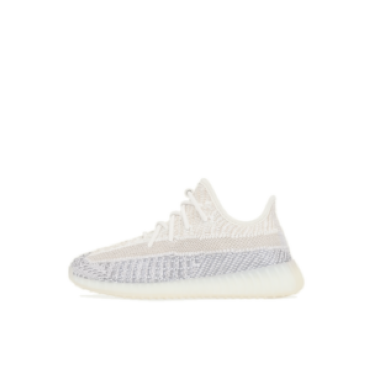

In [327]:
l = next(liked)
imshow(torchvision.utils.make_grid(l))

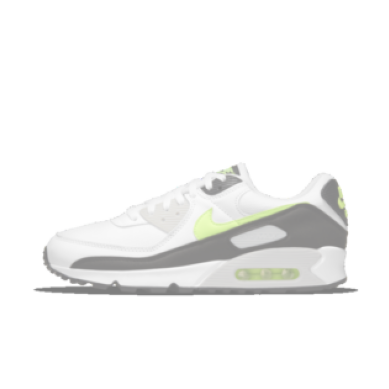

In [330]:
d = next(disliked)
imshow(torchvision.utils.make_grid(d))

In [276]:
class Net2(nn.Module):
    
    def __init__(self):
        super(Net2,self).__init__()
        
        self.pool = nn.MaxPool2d(2,2)
        
        self.conv1 = nn.Conv2d(3,6,5,stride=(2,2))
        self.conv2 = nn.Conv2d(6,10,5,stride=(2,2))
        
        self.bn1 = nn.BatchNorm2d(num_features=6)
        self.bn2 = nn.BatchNorm2d(num_features=10)
        self.bn3 = nn.InstanceNorm1d(100)
        
        self.fc1 = nn.Linear(2890,200)
        self.fc2 = nn.Linear(200,100)
        self.fc3 = nn.Linear(500,100)
        self.fc4 = nn.Linear(100,10)
        self.fc5 = nn.Linear(10,1)
        
    def forward(self,x):
        x = self.pool(F.relu(self.conv1(x)))
        #x = self.bn1(x)
        x = self.pool(F.relu(self.conv2(x)))
        #x = self.bn2(x)
        
        x = torch.flatten(x,1)
        
        x = F.tanh(self.fc1(x))
        x = F.tanh(self.fc2(x))
        #x = self.bn3(x)
        x = F.tanh(self.fc4(x))
        x = F.sigmoid(self.fc5(x))
        
        return x
    
net2 = Net2()
opt2 = optim.Adam(net2.parameters(), lr=1e-3)

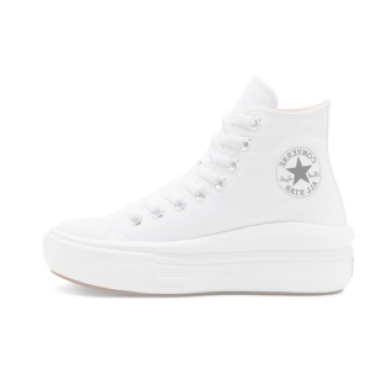

Do you like this shoe (y/n)?: n
tensor([[0.4651]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6256653666496277 tensor([[0.4651]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


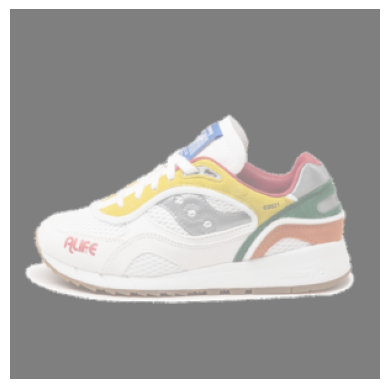

Do you like this shoe (y/n)?: y
tensor([[0.4357]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8307378888130188 tensor([[0.4357]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


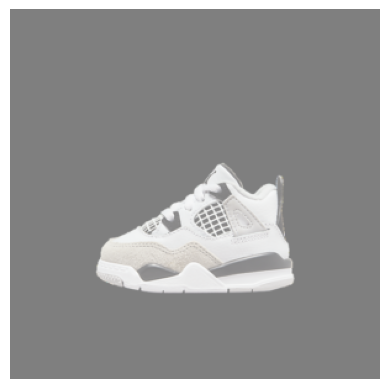

Do you like this shoe (y/n)?: y
tensor([[0.4671]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7611350417137146 tensor([[0.4671]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


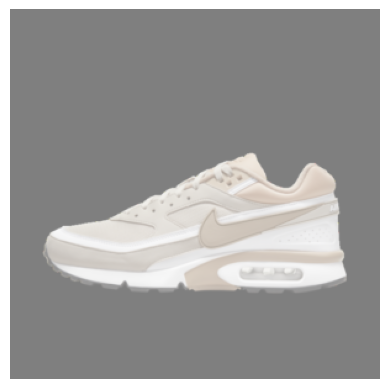

Do you like this shoe (y/n)?: y
tensor([[0.4942]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.704845130443573 tensor([[0.4942]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


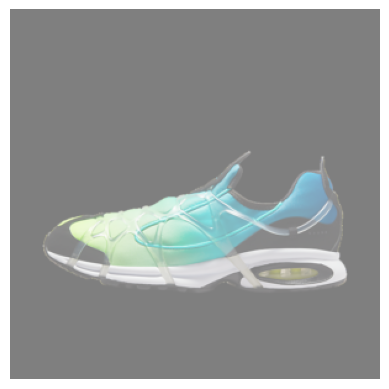

Do you like this shoe (y/n)?: n
tensor([[0.5348]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7653287053108215 tensor([[0.5348]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


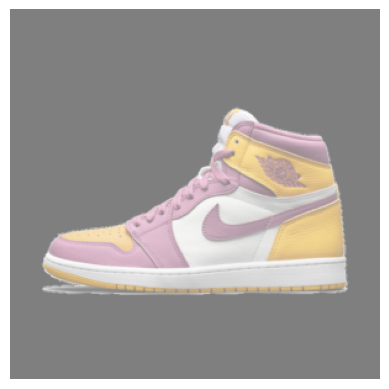

Do you like this shoe (y/n)?: yy
tensor([[0.5361]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6234170794487 tensor([[0.5361]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


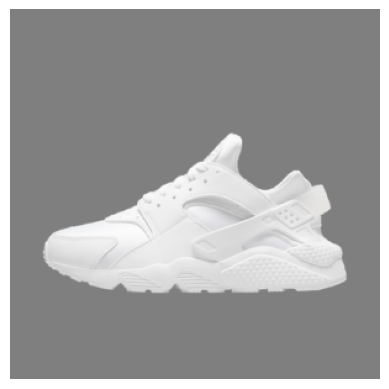

Do you like this shoe (y/n)?: n
tensor([[0.5512]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8012164831161499 tensor([[0.5512]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


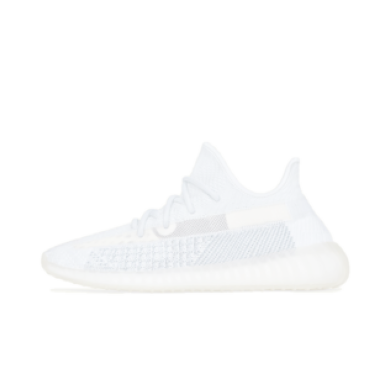

Do you like this shoe (y/n)?: n
tensor([[0.5033]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6998671293258667 tensor([[0.5033]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


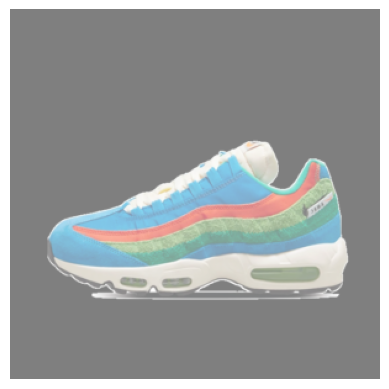

Do you like this shoe (y/n)?: yy
tensor([[0.5340]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6273157000541687 tensor([[0.5340]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


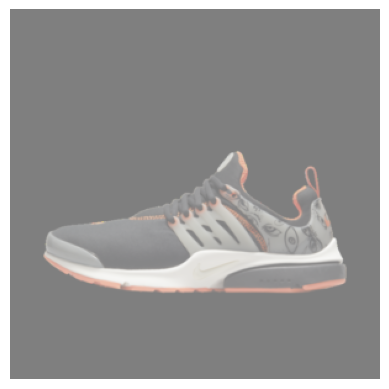

Do you like this shoe (y/n)?: n
tensor([[0.5365]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7689128518104553 tensor([[0.5365]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


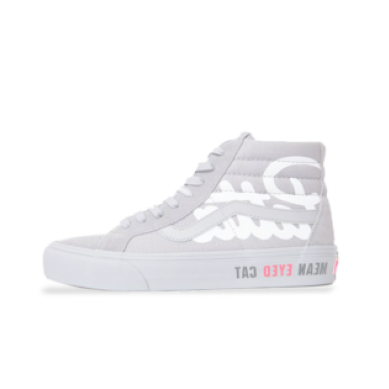

Do you like this shoe (y/n)?: n
tensor([[0.4645]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6246320009231567 tensor([[0.4645]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


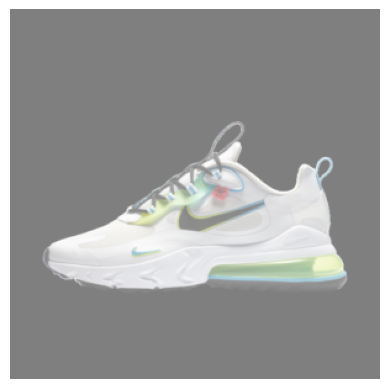

Do you like this shoe (y/n)?: y
tensor([[0.5148]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6640081405639648 tensor([[0.5148]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


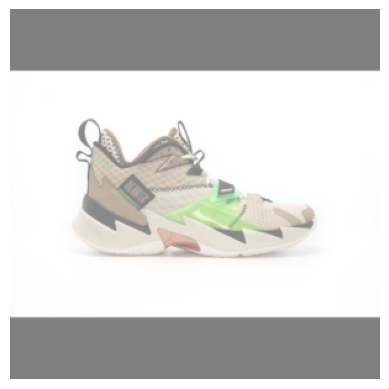

Do you like this shoe (y/n)?: n
tensor([[0.4774]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6489096879959106 tensor([[0.4774]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


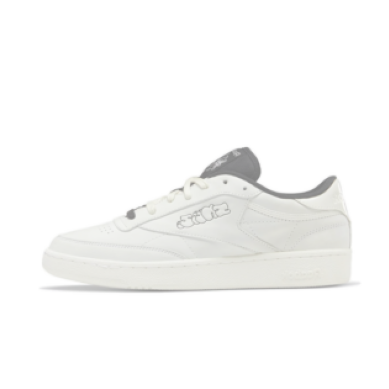

Do you like this shoe (y/n)?: n
tensor([[0.4366]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5736993551254272 tensor([[0.4366]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


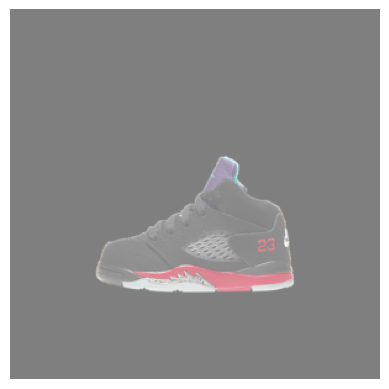

Do you like this shoe (y/n)?: yy
tensor([[0.5111]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6711298227310181 tensor([[0.5111]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


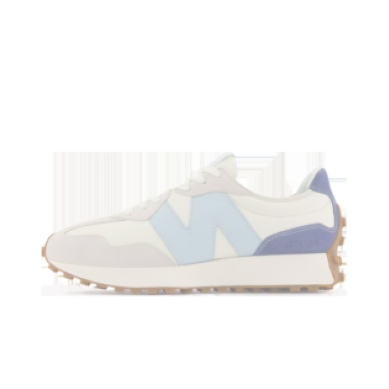

Do you like this shoe (y/n)?: yy
tensor([[0.4016]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9122989177703857 tensor([[0.4016]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


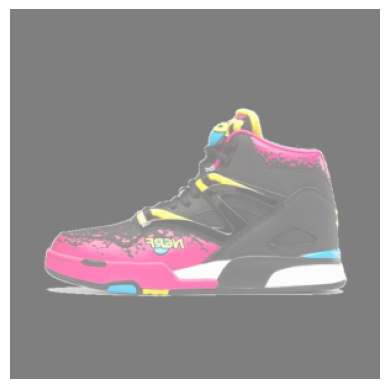

Do you like this shoe (y/n)?: n
tensor([[0.5232]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7406917214393616 tensor([[0.5232]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


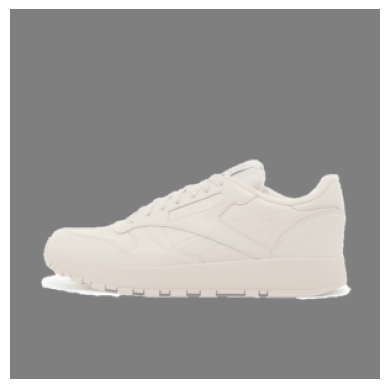

Do you like this shoe (y/n)?: n
tensor([[0.5152]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.724051833152771 tensor([[0.5152]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


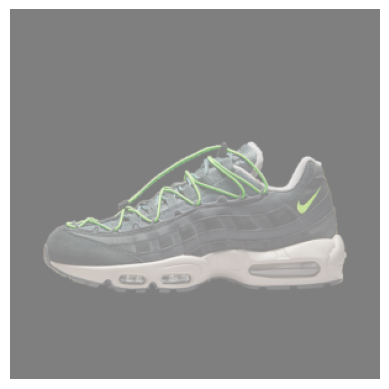

Do you like this shoe (y/n)?: y
tensor([[0.5065]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6802076697349548 tensor([[0.5065]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


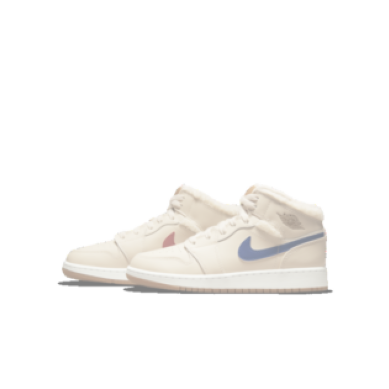

Do you like this shoe (y/n)?: y
tensor([[0.4078]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8968591690063477 tensor([[0.4078]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


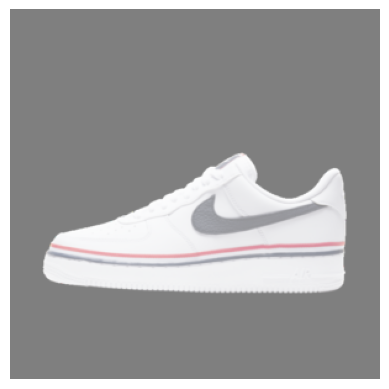

Do you like this shoe (y/n)?: y
tensor([[0.4971]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6988977193832397 tensor([[0.4971]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


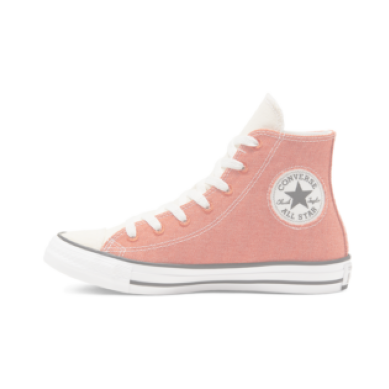

Do you like this shoe (y/n)?: y
tensor([[0.4279]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8487749695777893 tensor([[0.4279]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


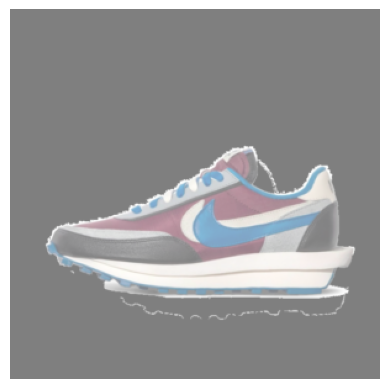

Do you like this shoe (y/n)?: yy
tensor([[0.4990]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6952309012413025 tensor([[0.4990]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


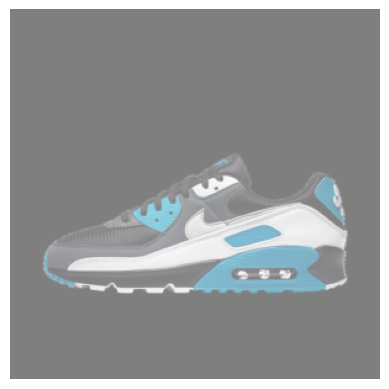

Do you like this shoe (y/n)?: yy
tensor([[0.5023]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6886166334152222 tensor([[0.5023]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


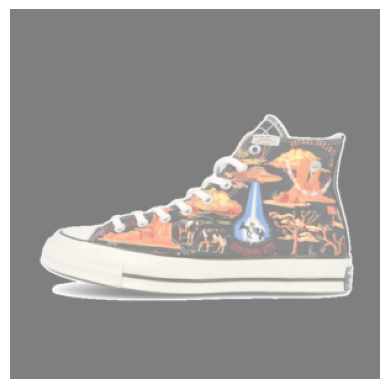

Do you like this shoe (y/n)?: n
tensor([[0.5086]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7103962898254395 tensor([[0.5086]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


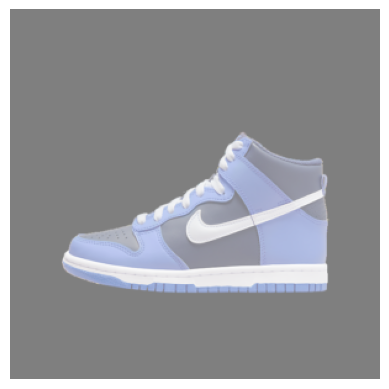

Do you like this shoe (y/n)?: y
tensor([[0.5120]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6694164276123047 tensor([[0.5120]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


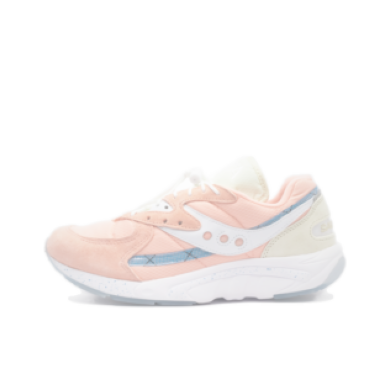

Do you like this shoe (y/n)?: n
tensor([[0.4576]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6117228269577026 tensor([[0.4576]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


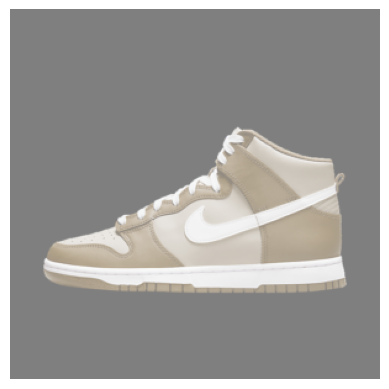

Do you like this shoe (y/n)?: y
tensor([[0.5251]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6440915465354919 tensor([[0.5251]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


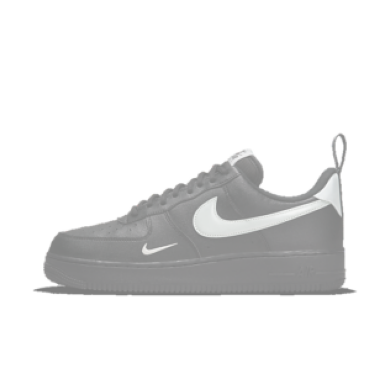

Do you like this shoe (y/n)?: y
tensor([[0.4628]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7703601121902466 tensor([[0.4628]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


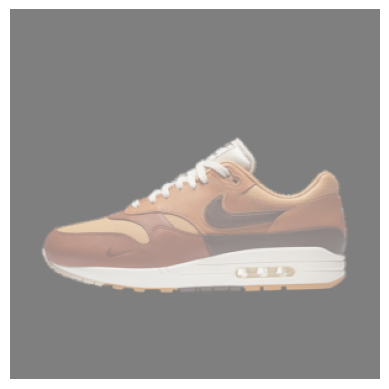

Do you like this shoe (y/n)?: yy
tensor([[0.5457]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6056770086288452 tensor([[0.5457]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


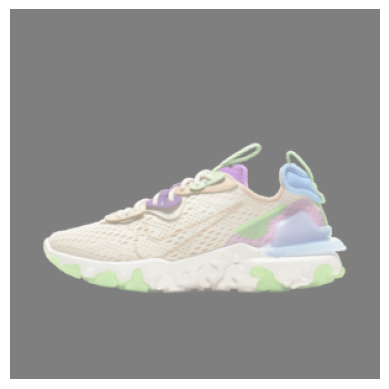

Do you like this shoe (y/n)?: y
tensor([[0.5587]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5821242332458496 tensor([[0.5587]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


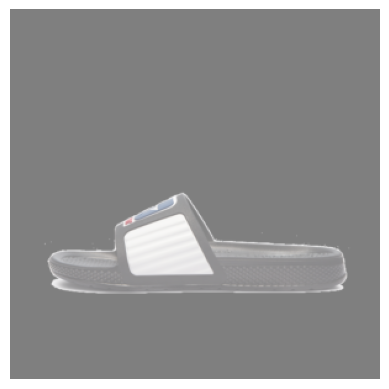

Do you like this shoe (y/n)?: n
tensor([[0.5795]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8663997054100037 tensor([[0.5795]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


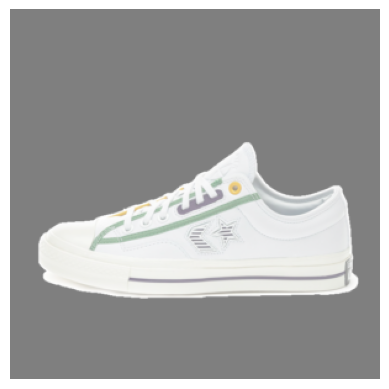

Do you like this shoe (y/n)?: n
tensor([[0.5837]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8763043284416199 tensor([[0.5837]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


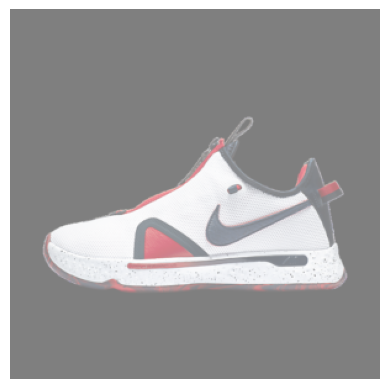

Do you like this shoe (y/n)?: yy
tensor([[0.5859]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5345346331596375 tensor([[0.5859]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


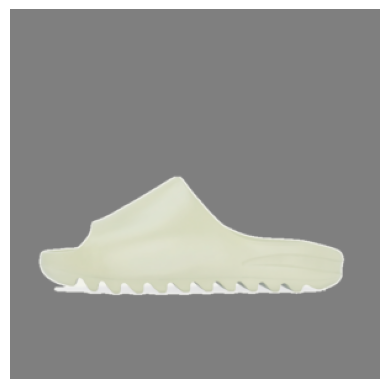

Do you like this shoe (y/n)?: n
tensor([[0.5909]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8938726186752319 tensor([[0.5909]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


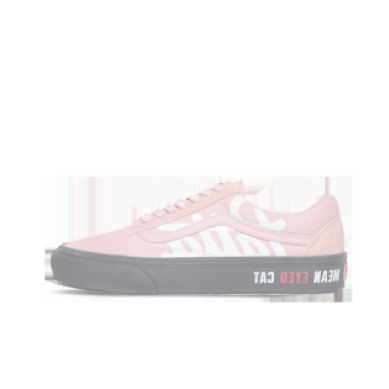

Do you like this shoe (y/n)?: n
tensor([[0.4761]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6464549899101257 tensor([[0.4761]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


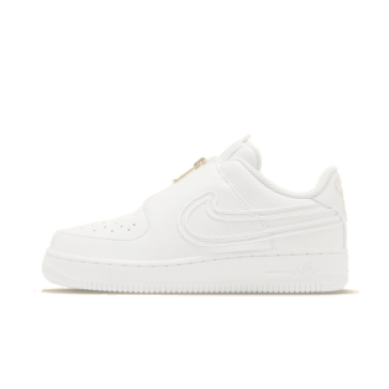

Do you like this shoe (y/n)?: y
tensor([[0.4678]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7596911191940308 tensor([[0.4678]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


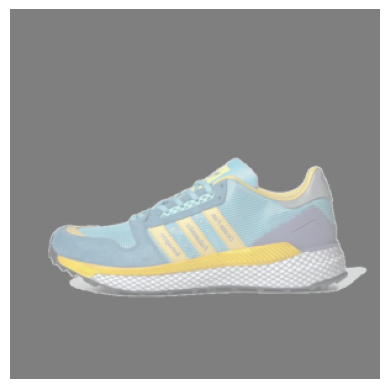

Do you like this shoe (y/n)?: n
tensor([[0.5774]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8614236116409302 tensor([[0.5774]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


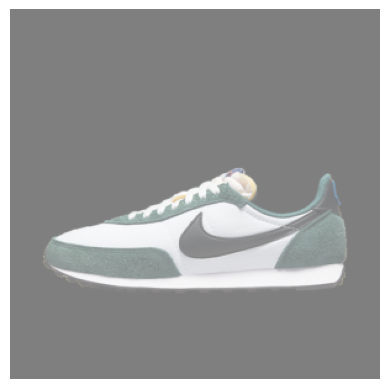

Do you like this shoe (y/n)?: y
tensor([[0.5674]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5667214393615723 tensor([[0.5674]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


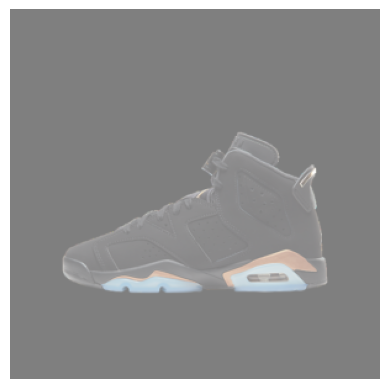

Do you like this shoe (y/n)?: y
tensor([[0.5637]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.5733083486557007 tensor([[0.5637]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


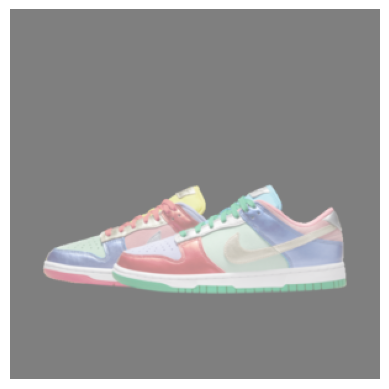

Do you like this shoe (y/n)?: n
tensor([[0.5632]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8281993269920349 tensor([[0.5632]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


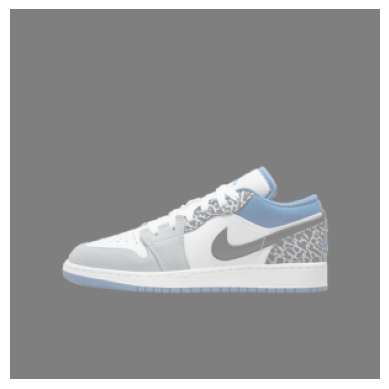

Do you like this shoe (y/n)?: n
tensor([[0.5565]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.8131657242774963 tensor([[0.5565]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


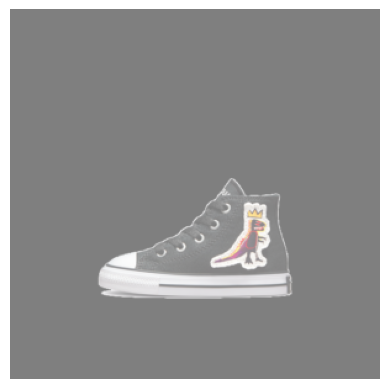

Do you like this shoe (y/n)?: n
tensor([[0.5496]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7975696921348572 tensor([[0.5496]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


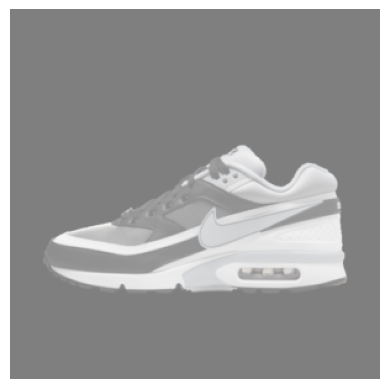

Do you like this shoe (y/n)?: y
tensor([[0.5345]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.626477062702179 tensor([[0.5345]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


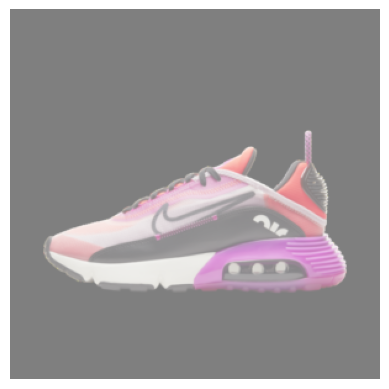

Do you like this shoe (y/n)?: y
tensor([[0.5288]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6372157335281372 tensor([[0.5288]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


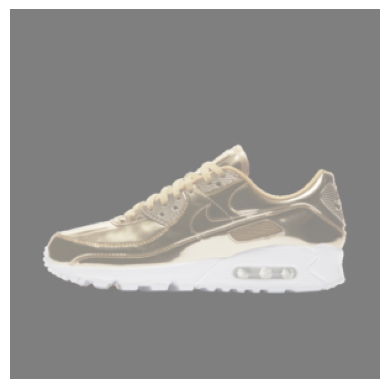

Do you like this shoe (y/n)?: n
tensor([[0.5256]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7456313371658325 tensor([[0.5256]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


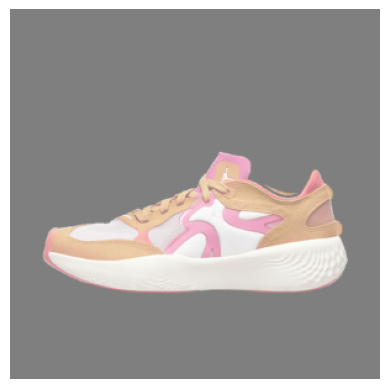

Do you like this shoe (y/n)?: n
tensor([[0.5201]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7342116832733154 tensor([[0.5201]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


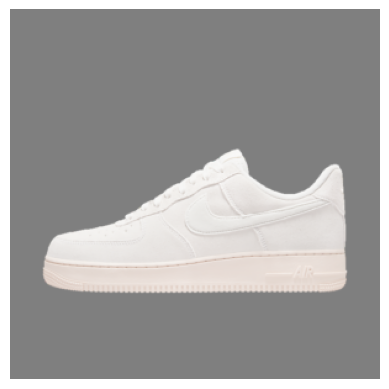

Do you like this shoe (y/n)?: y
tensor([[0.5075]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6782678365707397 tensor([[0.5075]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


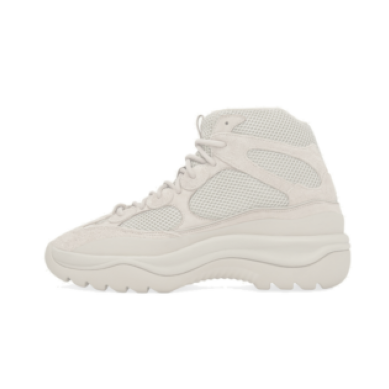

Do you like this shoe (y/n)?: n
tensor([[0.4714]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6375461220741272 tensor([[0.4714]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


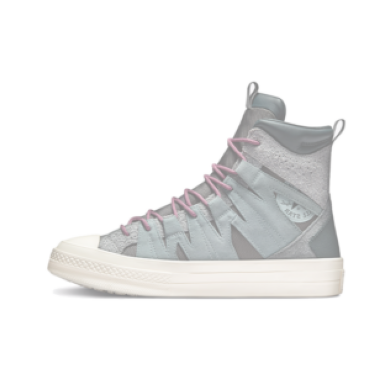

Do you like this shoe (y/n)?: n
tensor([[0.4726]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.63971346616745 tensor([[0.4726]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


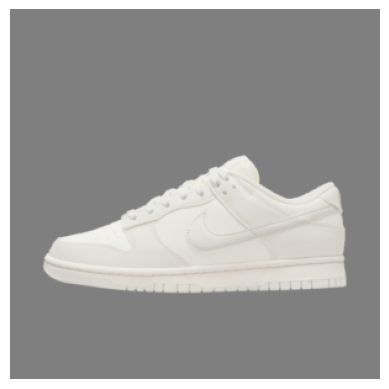

Do you like this shoe (y/n)?: y
tensor([[0.4963]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7005972266197205 tensor([[0.4963]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


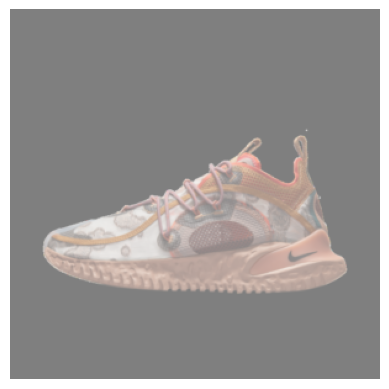

Do you like this shoe (y/n)?: y
tensor([[0.4983]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.696533203125 tensor([[0.4983]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


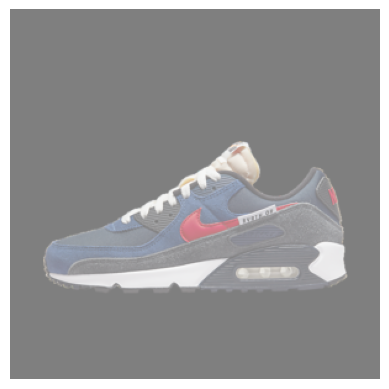

Do you like this shoe (y/n)?: y
tensor([[0.4991]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6949565410614014 tensor([[0.4991]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


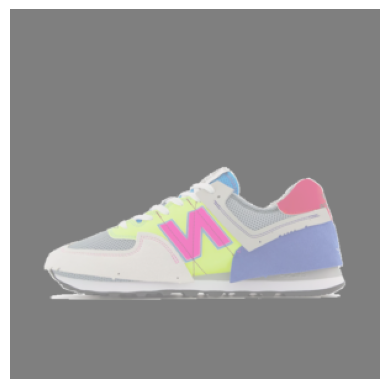

Do you like this shoe (y/n)?: n
tensor([[0.5008]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6946736574172974 tensor([[0.5008]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


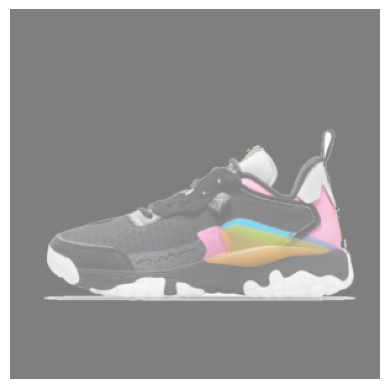

Do you like this shoe (y/n)?: n
tensor([[0.5028]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6987463235855103 tensor([[0.5028]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


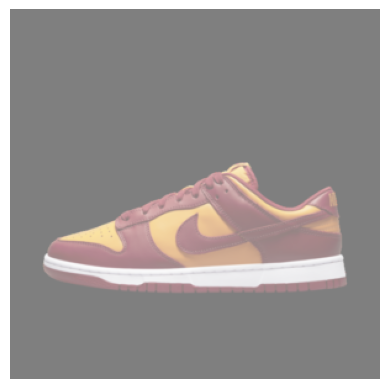

Do you like this shoe (y/n)?: y
tensor([[0.5024]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6883518099784851 tensor([[0.5024]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


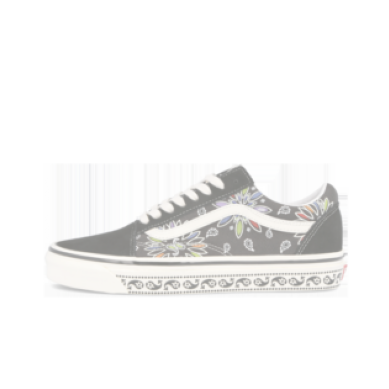

Do you like this shoe (y/n)?: n
tensor([[0.4682]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6314805746078491 tensor([[0.4682]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


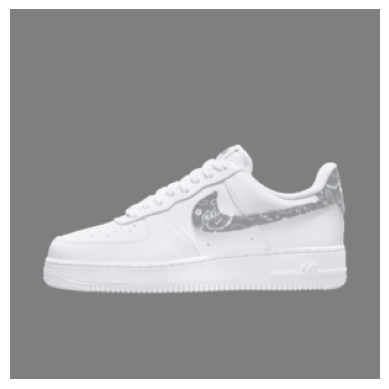

Do you like this shoe (y/n)?: y
tensor([[0.5017]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.6897221803665161 tensor([[0.5017]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


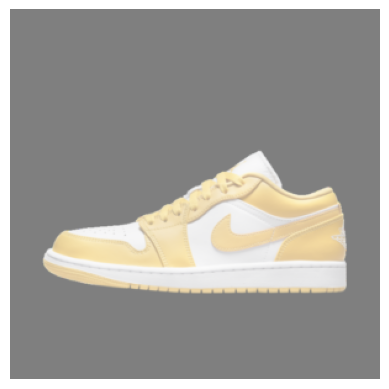

Do you like this shoe (y/n)?: n
tensor([[0.5057]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7046422958374023 tensor([[0.5057]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


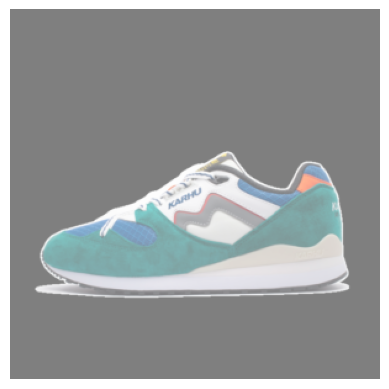

Do you like this shoe (y/n)?: n
tensor([[0.5048]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.7027629017829895 tensor([[0.5048]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


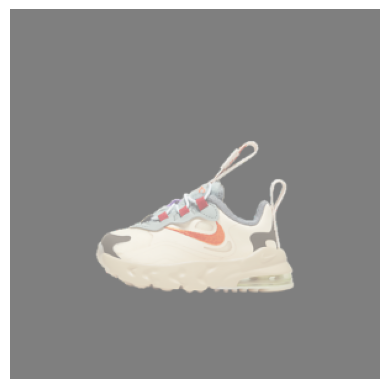

Do you like this shoe (y/n)?: y
tensor([[0.5033]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.68653404712677 tensor([[0.5033]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


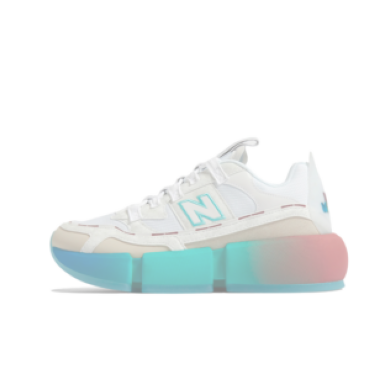

Do you like this shoe (y/n)?: n
tensor([[0.4624]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6206648349761963 tensor([[0.4624]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


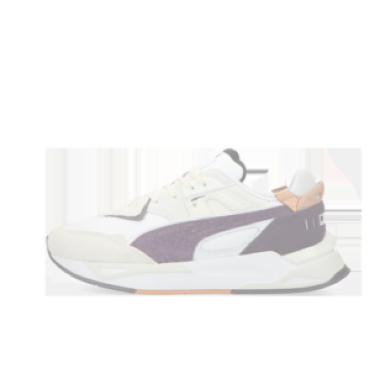

Do you like this shoe (y/n)?: n
tensor([[0.4610]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6180870532989502 tensor([[0.4610]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


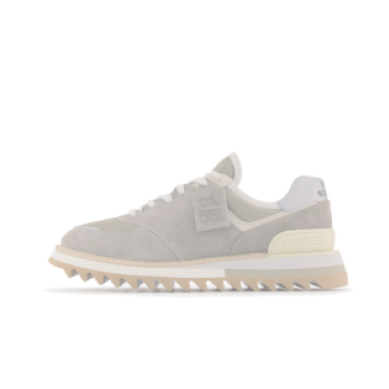

Do you like this shoe (y/n)?: n
tensor([[0.4580]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6124173998832703 tensor([[0.4580]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


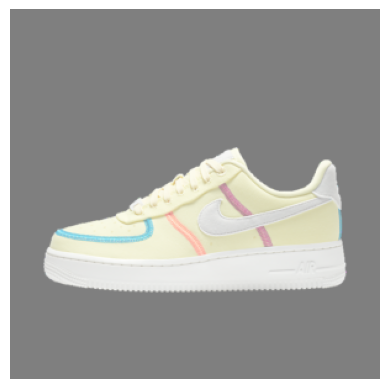

Do you like this shoe (y/n)?: n
tensor([[0.5020]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.697148323059082 tensor([[0.5020]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


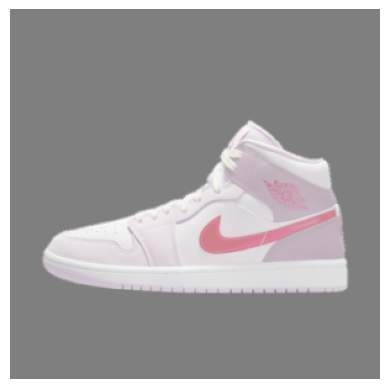

Do you like this shoe (y/n)?: n
tensor([[0.4979]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6888819336891174 tensor([[0.4979]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


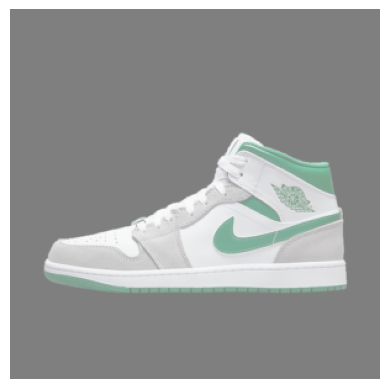

Do you like this shoe (y/n)?: n
tensor([[0.4933]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6798906922340393 tensor([[0.4933]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


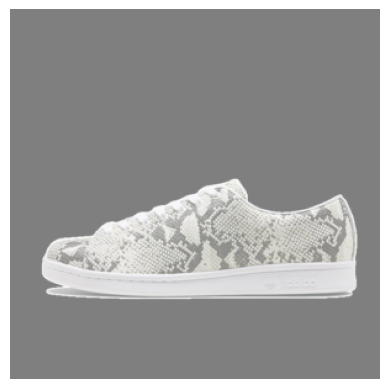

Do you like this shoe (y/n)?: n
tensor([[0.4854]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6643502116203308 tensor([[0.4854]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


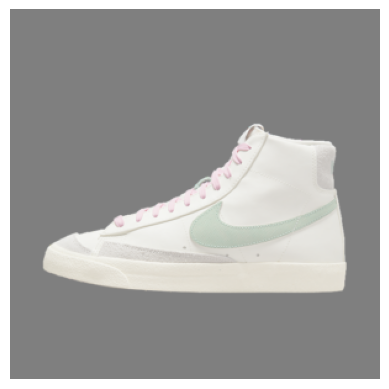

Do you like this shoe (y/n)?: y
tensor([[0.4778]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7386389970779419 tensor([[0.4778]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


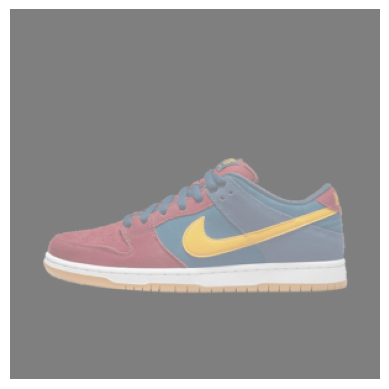

Do you like this shoe (y/n)?: y
tensor([[0.4749]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7446284890174866 tensor([[0.4749]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


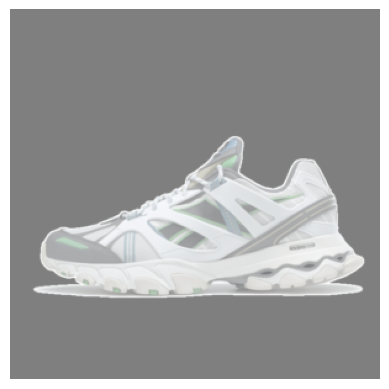

Do you like this shoe (y/n)?: n
tensor([[0.4711]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6370370984077454 tensor([[0.4711]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


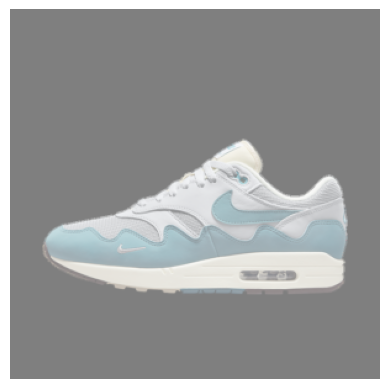

Do you like this shoe (y/n)?: yy
tensor([[0.4685]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7581411004066467 tensor([[0.4685]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


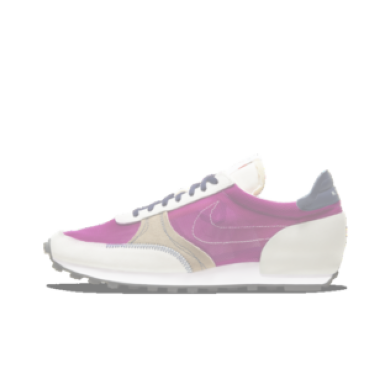

Do you like this shoe (y/n)?: n
tensor([[0.4215]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5473389029502869 tensor([[0.4215]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


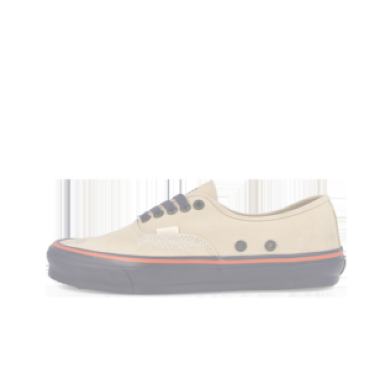

Do you like this shoe (y/n)?: n
tensor([[0.4147]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5355991125106812 tensor([[0.4147]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


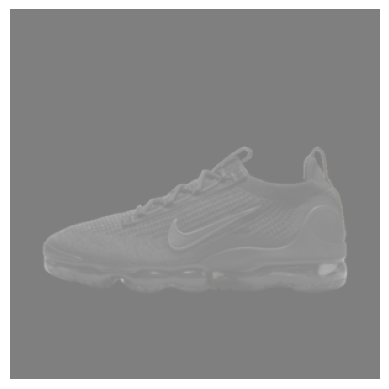

Do you like this shoe (y/n)?: y
tensor([[0.4675]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7604378461837769 tensor([[0.4675]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


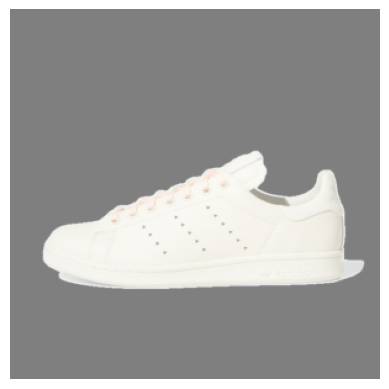

Do you like this shoe (y/n)?: n
tensor([[0.4590]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6143020987510681 tensor([[0.4590]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


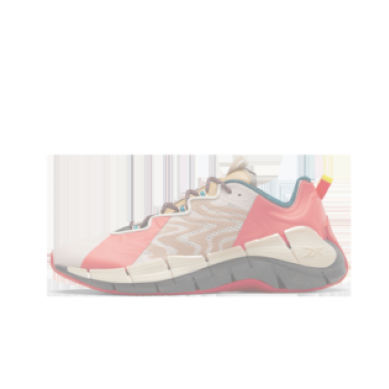

Do you like this shoe (y/n)?: n
tensor([[0.3787]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.4759313762187958 tensor([[0.3787]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


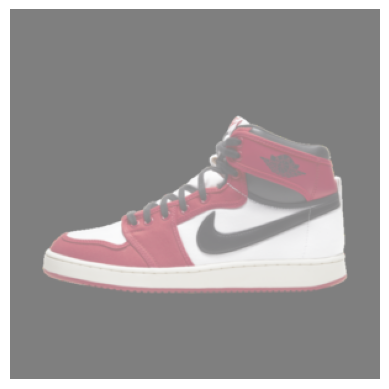

Do you like this shoe (y/n)?: n
tensor([[0.4521]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6016213297843933 tensor([[0.4521]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


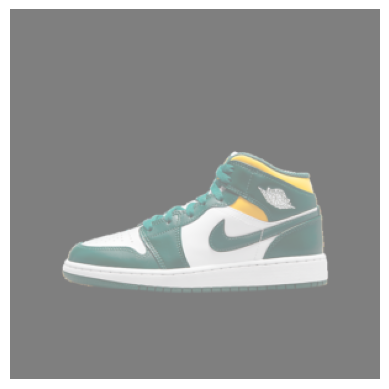

Do you like this shoe (y/n)?: n
tensor([[0.4469]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5921773314476013 tensor([[0.4469]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


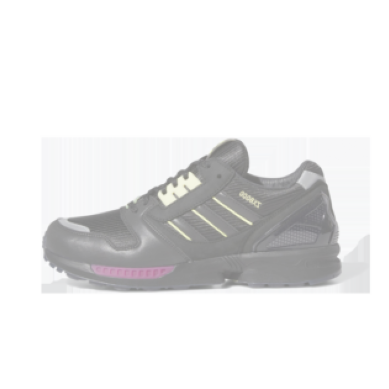

Do you like this shoe (y/n)?: n
tensor([[0.3183]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.3832154870033264 tensor([[0.3183]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


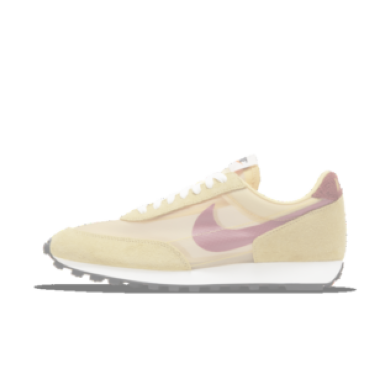

Do you like this shoe (y/n)?: y
tensor([[0.2903]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.2368429899215698 tensor([[0.2903]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


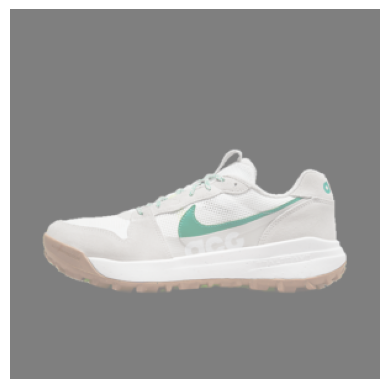

Do you like this shoe (y/n)?: yyy
tensor([[0.3942]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9309264421463013 tensor([[0.3942]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


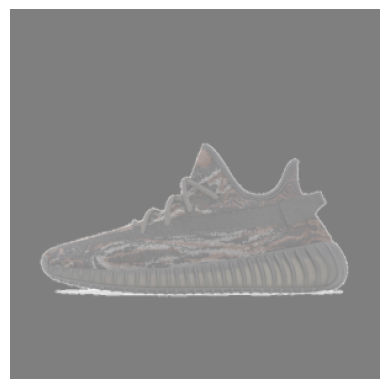

Do you like this shoe (y/n)?: y
tensor([[0.4294]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8453993201255798 tensor([[0.4294]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


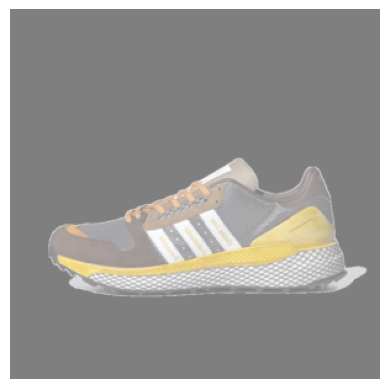

Do you like this shoe (y/n)?: n
tensor([[0.4157]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.5373954772949219 tensor([[0.4157]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


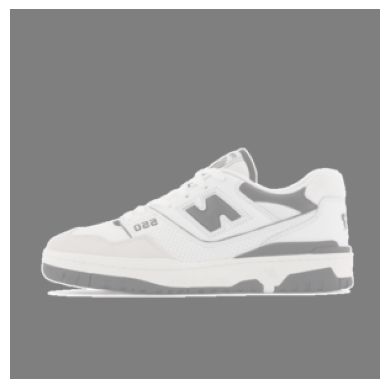

Do you like this shoe (y/n)?: yy
tensor([[0.3972]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9233119487762451 tensor([[0.3972]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


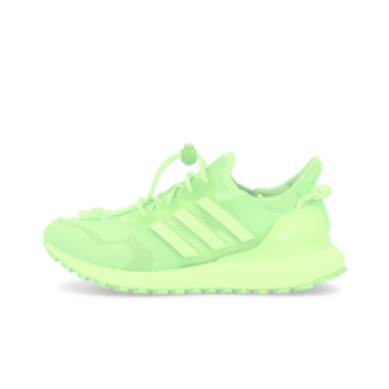

Do you like this shoe (y/n)?: y
tensor([[0.3088]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
1.1751831769943237 tensor([[0.3088]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


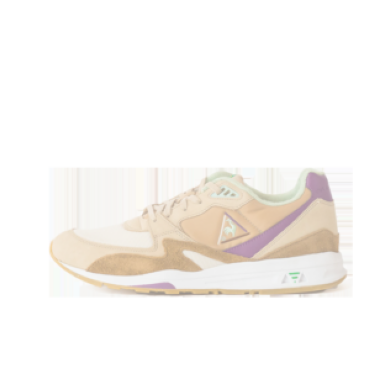

Do you like this shoe (y/n)?: n
tensor([[0.3264]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.3950982689857483 tensor([[0.3264]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


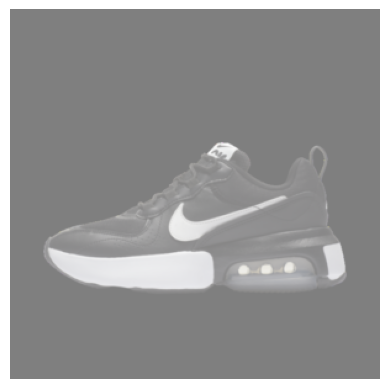

Do you like this shoe (y/n)?: yy
tensor([[0.4439]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8121404051780701 tensor([[0.4439]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


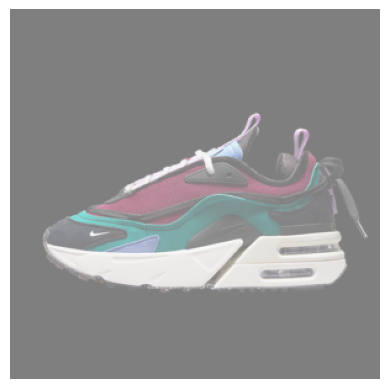

Do you like this shoe (y/n)?: y
tensor([[0.4451]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.8095157146453857 tensor([[0.4451]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


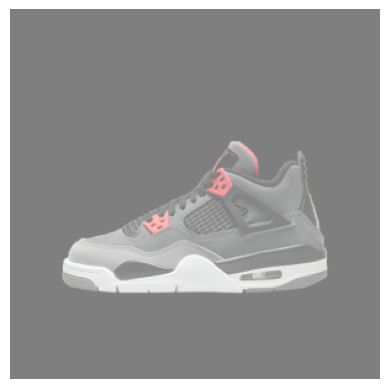

Do you like this shoe (y/n)?: yy
tensor([[0.4598]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7768720388412476 tensor([[0.4598]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


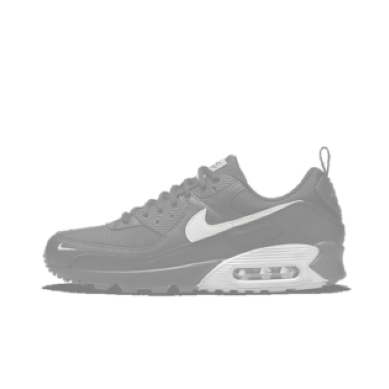

Do you like this shoe (y/n)?: y
tensor([[0.3692]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.9962823987007141 tensor([[0.3692]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


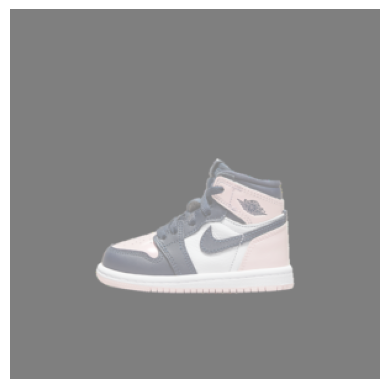

Do you like this shoe (y/n)?: n
tensor([[0.4765]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6471627950668335 tensor([[0.4765]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


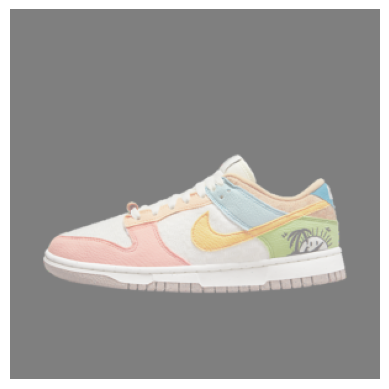

Do you like this shoe (y/n)?: y
tensor([[0.4758]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7426691055297852 tensor([[0.4758]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


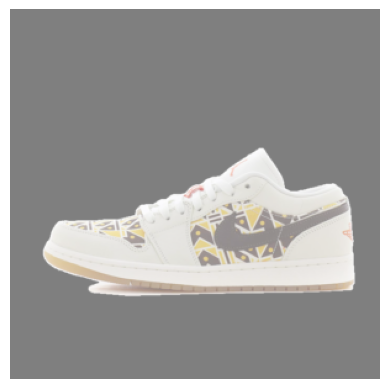

Do you like this shoe (y/n)?: n
tensor([[0.4774]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.649010956287384 tensor([[0.4774]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


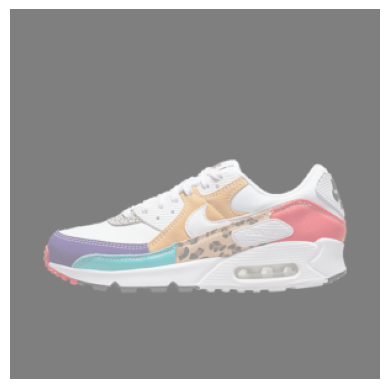

Do you like this shoe (y/n)?: n
tensor([[0.4805]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6549478769302368 tensor([[0.4805]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


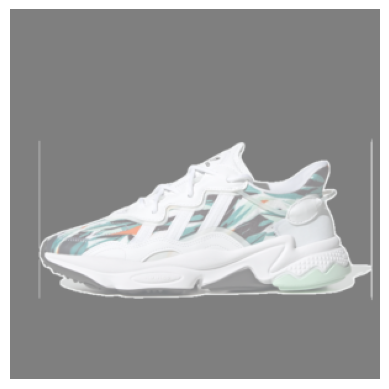

Do you like this shoe (y/n)?: n
tensor([[0.4788]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6516348123550415 tensor([[0.4788]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


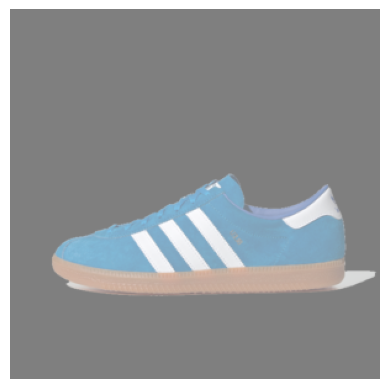

Do you like this shoe (y/n)?: y
tensor([[0.4785]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7370880246162415 tensor([[0.4785]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


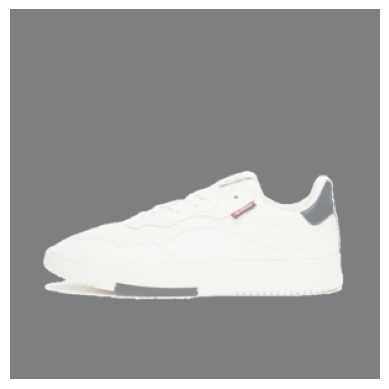

Do you like this shoe (y/n)?: n
tensor([[0.4761]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6464771628379822 tensor([[0.4761]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


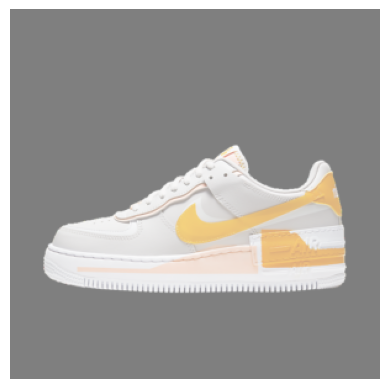

Do you like this shoe (y/n)?: n
tensor([[0.4758]], grad_fn=<SigmoidBackward0>) tensor([[0.]])
0.6457937955856323 tensor([[0.4758]], grad_fn=<SigmoidBackward0>) tensor([[0.]])


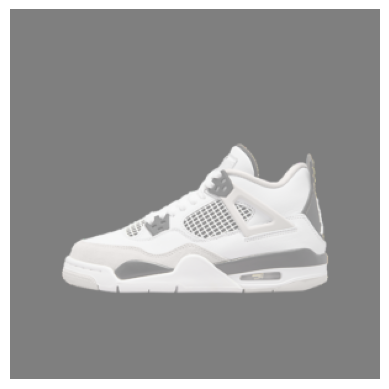

Do you like this shoe (y/n)?: y
tensor([[0.4724]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7498704791069031 tensor([[0.4724]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


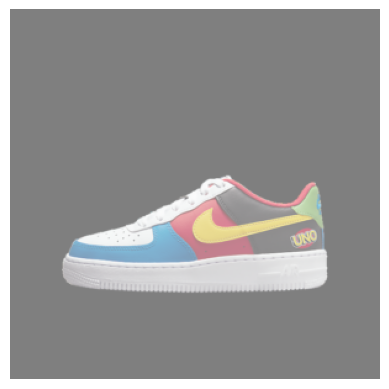

Do you like this shoe (y/n)?: yy
tensor([[0.4719]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.7510379552841187 tensor([[0.4719]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


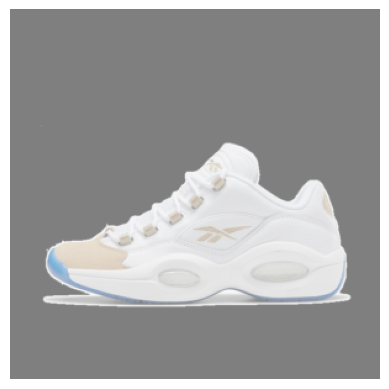

Do you like this shoe (y/n)?: y
tensor([[0.4692]], grad_fn=<SigmoidBackward0>) tensor([[1.]])
0.756756067276001 tensor([[0.4692]], grad_fn=<SigmoidBackward0>) tensor([[1.]])


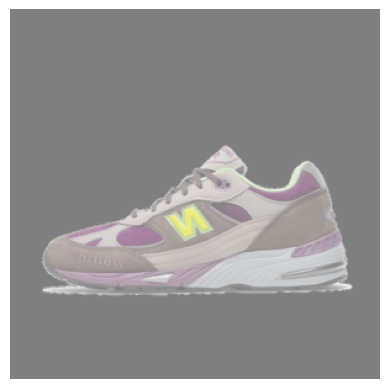

Do you like this shoe (y/n)?: q


In [277]:
for i,data in enumerate(trainLoader):
    opt2.zero_grad()
    
    imshow(torchvision.utils.make_grid(data))
    
    label = getLabel()
    if label == 'q': break
    
    output = net2(data)
    print(output,label)
    loss = criterion(output,label)
    loss.backward()
    opt2.step()
    
    print(loss.item(),output,label)

In [308]:
net.parameters()

<generator object Module.parameters at 0x7ff0d14954a0>

In [309]:
for param in net.parameters():
    print(param)

Parameter containing:
tensor([[[[ 0.0328, -0.0419,  0.0023,  0.1084, -0.0473],
          [ 0.0845, -0.0780, -0.0782, -0.0259,  0.0440],
          [ 0.0214,  0.0365,  0.0230,  0.0607, -0.0269],
          [ 0.0231, -0.0809,  0.0310, -0.0391, -0.0872],
          [-0.0320,  0.0153, -0.0070,  0.0978,  0.0505]],

         [[ 0.0002, -0.1028,  0.0754, -0.0989, -0.0183],
          [ 0.0061, -0.0829, -0.0207, -0.0978, -0.0003],
          [ 0.0704, -0.0215,  0.0103,  0.0091,  0.0254],
          [ 0.0411,  0.0263, -0.1146,  0.0976,  0.0807],
          [-0.0851,  0.1008,  0.0067,  0.0394,  0.0499]],

         [[-0.0976,  0.0685,  0.0744,  0.1006, -0.0979],
          [-0.0837,  0.0200,  0.0928, -0.0156, -0.0928],
          [ 0.1084, -0.0733, -0.1046, -0.0909, -0.1053],
          [-0.0696, -0.0371, -0.0921,  0.0374,  0.0205],
          [-0.0621, -0.1033,  0.0080,  0.0733, -0.0969]]],


        [[[ 0.0184, -0.0004, -0.1144, -0.0445,  0.0068],
          [-0.0505, -0.0135, -0.0250, -0.0286, -0.0495],
 

In [310]:
PATH = './sneakNet1.pth'
torch.save(net.state_dict(), PATH)